# What drives commuting decisions?

2601547 (University of Bristol)  
May 2, 2025

This study answers, “which structural socio-economic factors between regions most influence the relative popularity of commuting routes?” This question is important as transport policy, development planning and wider government initiatives such as the “Levelling Up” agenda are all influenced by commuting patterns. The analysis uses a dataset of commuting flows between local authorities in England. It employs statistical and machine learning techniques (such as OLS, SEM and Random Forest) to identify the most significant factors influencing commuting decisions. The study finds that across all methods, distance is the most important factor influencing commuting flows, generally followed by population, median pay and housing growth differences between local authorities. The study also finds that the relative importance of these factors varies by region, with spatial aspects playing a key role in the influence of different factors.

# 1. Research Question

The question asks, “what factors are influential in driving commuting decisions?” The provided dataset includes daily commuting data between local authorities (LAs) in England over the course of 2019. `'journey_score,`’ the key candidate for the dependent variable, represents the popularity of each route.

As with all inferential tasks, there are multiple paths to understanding and addressing the question.  The dataset is daily, and `'journey_score'` varies daily per route. The `'journey_score'` appears standardised, i.e. popularity is relative to other routes. However, the variables are point in time, i.e. constant over the year, mainly focusing on socio-economic aspects of regions.

To me, this would imply that rather than looking at individual daily trips, which may be influenced by variables such as weather, sickness outbreaks across regions, fuel prices, etc., we are looking to identify more structural differences between regions.

Therefore, the research question I intend to answer is:

<h5 style="margin-top: 30px; margin-bottom: 30px; font-style: italic;">

“Which structural socio-economic factors between regions most influence the relative popularity of commuting routes?”

</h5>

This research question is not the only way to interpret this task, and it will, in turn, directly influence the decisions I intend to make for inferential design. For example, aggregating daily data over the year per route may be more appropriate than using the current daily set, as structural socio-economic factors such as average wages do not vary materially over the course of a week or month.

The submission is structured to focus on the key aspects of statistical inference and analytics. Code is included where helpful to explain the process, and excluded where not, however complete code can be found in the ‘Article Notebook’. Some elements of the process, such as explanatory data analysis, are found in the appendices and referenced throughout the submission. Each section summarises the key points, and a conclusion is provided at the end of the submission.

# 2. Inferential Design

> **Section Summary**
>
> -   A cleaned version of the dataset is loaded in
>
> -   **Data Refinement:**
>
>     -   The dataset is refined for the research question by dropping:
>         -   Routes with the same origin and destination
>         -   Days of the year which are non-typical for commuting (i.e. unrepresentative data in terms of the research question)
>             -   Weekends
>             -   Bank Holidays
>
> -   **Feature Additions:**
>
>     -   Geospatial and rent cost features are added to the dataset to reduce omitted-variable bias (OVB) and improve model performance
>
> -   **Data Aggregation:**
>
>     -   Absolute differences for each variable are calculated between the two local authorities for each route
>     -   The dataset is aggregated to one row per route, per local authority pair, per year
>
> -   **Feature Transformations:**
>
>     -   Skewness is identified in the data
>     -   Discussion around addressing this depends on the model used

> **Warning**
>
> This code follows a setup (<a href="#sec-setup" class="quarto-xref">Appendix A - Setup: Section 6.1</a>) and preliminary exploratory analysis of the data (<a href="#sec-eda" class="quarto-xref">Appendix B - EDA: Section 6.2</a>) in the Appendices.
>
> The code in this section is intended to be run independently following that setup with the cleaned dataset, which can be downloaded from the [Github project repo](https://github.com/2601547/commute). However, the library installations must be first run and can be found in the <a href="#sec-packages" class="quarto-xref">Appendix A - Packages: Section 6.1.2</a> section.
>
> To run independently from the original dataset, it is important to follow the step-by-step process in the <a href="#sec-appendices" class="quarto-xref">Appendices: Section 6</a> section, that precedes this section in terms of the running order.

The cleaned (achieved in the <a href="#sec-appendices" class="quarto-xref">Appendices: Section 6</a>) dataset is loaded in:

``` python
base_data_dir = os.path.abspath(
    '../../1. Data/LAcommute')
commute = pd.read_csv(
    os.path.join(base_data_dir, "LAcommute_clean.csv"), index_col=0)

commute
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | gcse_rate_origin | life_satisfaction_origin | housing_growth_origin | value_added_hourly_dest | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-01 | Hartlepool | E06000001 | Hartlepool | E06000001 | 1.4414 | 9 | 0.000000 | 92401 | 92401 | ... | 67.6 | 7.33 | 161 | 28.31 | 487.4 | 67.1 | 12.9 | 67.6 | 7.33 | 161 |
| 1 | 2019-01-01 | Hartlepool | E06000001 | County Durham | E06000047 | -0.3129 | 3 | 37592.170378 | 92401 | 518562 | ... | 67.6 | 7.33 | 161 | 28.96 | 469.4 | 71.4 | 14.1 | 67.6 | 7.43 | 1343 |
| 2 | 2019-01-01 | Middlesbrough | E06000002 | Middlesbrough | E06000002 | 1.0253 | 10 | 0.000000 | 142134 | 142134 | ... | 63.2 | 7.21 | 456 | 29.30 | 420.8 | 65.6 | 15.4 | 63.2 | 7.21 | 456 |
| 3 | 2019-01-01 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.3086 | 7 | 13069.176565 | 142134 | 136699 | ... | 63.2 | 7.21 | 456 | 26.54 | 439.2 | 68.4 | 13.3 | 69.6 | 7.44 | 365 |
| 4 | 2019-01-01 | Middlesbrough | E06000002 | Stockton-on-Tees | E06000004 | 0.3772 | 8 | 7379.212731 | 142134 | 196860 | ... | 63.2 | 7.21 | 456 | 34.37 | 469.4 | 74.8 | 13.2 | 69.5 | 7.40 | 616 |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 301022 | 2019-12-31 | Westminster | E09000033 | Sutton | E09000029 | -0.6732 | 4 | 16964.439602 | 208415 | 208516 | ... | 77.3 | 7.21 | 580 | 35.19 | 565.8 | 77.4 | 9.0 | 82.0 | 7.36 | 313 |
| 301023 | 2019-12-31 | Westminster | E09000033 | Tower Hamlets | E09000030 | 1.3720 | 10 | 8616.142460 | 208415 | 305066 | ... | 77.3 | 7.21 | 580 | 60.46 | 680.3 | 74.4 | 4.4 | 72.4 | 7.13 | 3248 |
| 301024 | 2019-12-31 | Westminster | E09000033 | Waltham Forest | E09000031 | -0.4483 | 6 | 13672.865893 | 208415 | 281015 | ... | 77.3 | 7.21 | 580 | 34.63 | 624.7 | 71.5 | 7.2 | 71.5 | 7.30 | 1263 |
| 301025 | 2019-12-31 | Westminster | E09000033 | Wandsworth | E09000032 | 0.1871 | 8 | 7117.584240 | 208415 | 334558 | ... | 77.3 | 7.21 | 580 | 35.15 | 746.7 | 84.9 | 6.2 | 74.2 | 7.34 | 1415 |
| 301026 | 2019-12-31 | Westminster | E09000033 | Westminster | E09000033 | 1.6534 | 10 | 0.000000 | 208415 | 208415 | ... | 77.3 | 7.21 | 580 | 52.46 | 771.6 | 67.2 | 5.1 | 77.3 | 7.21 | 580 |

<p>301027 rows × 24 columns</p>
</div>

The cleaned dataset removes all routes with missing values e.g. “City of London” and “Isles of Scilly”. The full list of columns / variables can be seen below:

``` python
commute.columns
```

    Index(['date', 'area_name_origin', 'area_code_origin', 'area_name_dest',
           'area_code_dest', 'journey_score', 'journey_count_decile', 'distance',
           'population_origin', 'population_dest', 'value_added_hourly_origin',
           'median_weekly_pay_origin', 'emp_rate_origin', 'travel_time_origin',
           'gcse_rate_origin', 'life_satisfaction_origin', 'housing_growth_origin',
           'value_added_hourly_dest', 'median_weekly_pay_dest', 'emp_rate_dest',
           'travel_time_dest', 'gcse_rate_dest', 'life_satisfaction_dest',
           'housing_growth_dest'],
          dtype='object')

## 2.1 Data Refinement

> **Subsection Summary**
>
> -   The dataset is refined for the reserach quesion by dropping:
>     -   Routes with the same origin and destination
>     -   Days of the year which are non-typical for commuting (i.e. unrepresentative data in terms of the research question)
>         -   Weekends
>         -   Bank Holidays

My research question focuses on the structural differences between regions, and therefore, I will be using one `'journey_score'` per route, per local authority pair. This can also be achieved in multiple ways (e.g. taking data for each route for one day only, averaging over some time, etc.). I will use the average over the year, as I believe this is the most representative of the structural differences between regions and allows full use of the dataset. This also avoids any potential bias from seasonal effects (such as holidays), weather, or other temporal factors and instead smoothes out the data.

To aggregate this way, I will need to remove any data that is not representative of structural commuting route popularity. This includes removing days that are not typical for commuting, such as weekends and bank holidays.

-   Weekends are not typical for commuting as most people do not work and therefore commute on weekend
-   Bank holidays are not typical for commuting as most people do not work on bank holidays

One of the advantages of using the average over the year instead of a smaller subset is that these effects are minimised. However, it is still important to consider this potential source of bias in the data and remove it, as I want the model to be as representative as possible to get stronger confidence in the inference.

I drop all rows where there are weekends:

``` python
commute['date'] = commute['date'].apply(
    pd.to_datetime, format='%Y-%m-%d', errors='coerce')
commute = commute[commute['date'].dt.dayofweek < 5]
```

Pull bank holidays from the [UK Government’s Bank Holiday API](https://www.gov.uk/bank-holidays.json), and drops all rows where the date is a bank holiday:

``` python
url = 'https://www.gov.uk/bank-holidays.json'
response = requests.get(url)
gov_uk_bank_holdadays = response.json()

eng_wales_holidays = gov_uk_bank_holdadays['england-and-wales']['events'] # filter to england and wales...
bank_holidays = [pd.to_datetime(event['date']) for event in eng_wales_holidays if '2019' in event['date']] # ... in 2019

commute = commute[~commute['date'].isin(bank_holidays)]
```

Similarly, there are routes in the dataset where the origin and destination are the same. These can easily be identified when `'distance' = 0` and capture employees commuting within the same local authority.

Since the research question is focused on regional socio-economic structural differences, these are irrelevant as there are no differences for intra-regional commuting. These routes are, therefore, dropped:

``` python
commute = commute[commute['distance'] != 0]
```

## 2.2 Feature Additions

> **Subsection Summary**
>
> -   Geospatial, centrality and rent cost features are added to the dataset to reduce omitted-variable bias (OVB) and improve model performance

The dataset provided is largely complete, however, omitted-variable bias (OVB) is a key concern in any inferential task and so additional features I believe may be useful are added. These are:

-   Coordinates of the local authorities
-   A centrality measure
-   Accommodation rental costs

Once multicollinearity is assessed, these may need to be removed.

### 2.2.1 Geometry

LAs are regional by definition. Therefore, geospatial relationships may need to be considered, and coordinates are added to the dataset accordingly.

The coordinates for the LA can be found in the [government depo](https://geoportal.statistics.gov.uk/datasets/9cb3c710143649499ff6acaca927d205_0/explore), and is downloaded as the file `"LAD_Dec_2019_Boundaries_UK_BFC_2022_-5126023737554987305.csv"`.

``` python
LA_coordinates = pd.read_csv(
    os.path.join(base_data_dir, "LAD_Dec_2019_Boundaries_UK_BFC_2022_-5126023737554987305.csv"), index_col=0)

LA_coordinates.head(3)
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | objectid | lad19cd | lad19nm | lad19nmw | bng_e | bng_n | long | lat | st_areasha | st_lengths | Shape\_\_Area | Shape\_\_Length | GlobalID |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| FID |  |  |  |  |  |  |  |  |  |  |  |  |  |
| 1 | 1 | E06000001 | Hartlepool |  | 447160 | 531474 | -1.27018 | 54.67614 | 9.371262e+07 | 71011.933949 | 2.797890e+08 | 122680.152623 | d3127426-63c8-4358-a554-b3fe4f0e537e |
| 2 | 2 | E06000002 | Middlesbrough |  | 451141 | 516887 | -1.21099 | 54.54467 | 5.388156e+07 | 44481.691242 | 1.598722e+08 | 76614.777246 | 7caac8a1-a10b-4878-a2ab-4fdb80e987a4 |
| 3 | 3 | E06000003 | Redcar and Cleveland |  | 464361 | 519597 | -1.00608 | 54.56752 | 2.450695e+08 | 96703.989701 | 7.274510e+08 | 166599.724875 | 96cc264b-6155-48cb-8fc0-7e41684d2682 |

</div>

``` python
def merge_coordinates(df, coordinates, merge_col, prefix):
    df = df.merge(
        coordinates[['lad19nm', 'lat', 'long']],
        how='left',
        left_on=merge_col,
        right_on='lad19nm'
    )
    df = df.rename(columns={
        'lat': f'lat_{prefix}',
        'long': f'long_{prefix}'
    })
    return df.drop(columns=['lad19nm'])
```

``` python
commute = merge_coordinates(commute, LA_coordinates, 'area_name_origin', 'origin')
commute = merge_coordinates(commute, LA_coordinates, 'area_name_dest', 'dest')
```

``` python
# commute
```

### 2.2.2 Centrality

Centrality measures how connected a node is in a network. It may add insight into major hubs, act as a proxy for urban/rural splits, and soak up concerns around spatial autocorrelation.

This is literature-driven, as Tranos et al. (2015) demonstated that centrality play a key role in understanding international migration flows, and it is reasonable to believe this may also apply at a smaller scale.

``` python
commute_centr = commute.copy() # to do work in the appendix
```

I use an undirected graph (visualised in <a href="#fig-centr" class="quarto-xref">Figure 5</a>) and calulate a normalised centrality metric based on node connections (i.e. the number of connections divided by the maximum number of connections), as this can be done quickly with the data provided.

``` python
G = nx.Graph()
for _, row in commute_centr.iterrows():
    G.add_edge(row['area_name_origin'], row['area_name_dest'])
```

``` python
degree_centrality = nx.degree_centrality(G)

centrality = pd.DataFrame({
    'area_name': list(degree_centrality.keys()),
    'centrality': list(degree_centrality.values())
})
```

``` python
def merge_centrality(df, centrality, merge_col, prefix):
    df = df.merge(
        centrality,
        how='left',
        left_on=merge_col,
        right_on='area_name'
    )
    df = df.rename(columns={
        'centrality': f'centrality_{prefix}'
    })
    return df.drop(columns=['area_name'])
```

``` python
commute = merge_centrality(commute, centrality, 'area_name_origin', 'origin')
commute = merge_centrality(commute, centrality, 'area_name_dest', 'dest')
```

``` python
commute.head(3)
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest | lat_origin | long_origin | lat_dest | long_dest | centrality_origin | centrality_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-02 | Hartlepool | E06000001 | Stockton-on-Tees | E06000004 | 1.5423 | 5 | 12951.008041 | 92401 | 196860 | ... | 13.2 | 69.5 | 7.40 | 616 | 54.67614 | -1.27018 | 54.556911 | -1.30664 | 0.025862 | 0.051724 |
| 1 | 2019-01-02 | Hartlepool | E06000001 | County Durham | E06000047 | 1.5683 | 5 | 37592.170378 | 92401 | 518562 | ... | 14.1 | 67.6 | 7.43 | 1343 | 54.67614 | -1.27018 | 54.685131 | -1.84050 | 0.025862 | 0.077586 |
| 2 | 2019-01-02 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.9239 | 8 | 13069.176565 | 142134 | 136699 | ... | 13.3 | 69.6 | 7.44 | 365 | 54.54467 | -1.21099 | 54.567520 | -1.00608 | 0.043103 | 0.025862 |

<p>3 rows × 30 columns</p>
</div>

### 2.2.3 Accommodation Rental Cost

Multiple studies (So et al., 2001; Ahrens and Lyons, 2021; Wander and Blumenberg, 2024) have shown that the cost of accommodation is a key factor in commuting decisions, using varying metrics such as house prices, rental fees, etc. I include rental costs as the data is available at the LA level in 2019 from the same data source as other variables (ONS). The metric can be used as a proxy for accommodation costs generally (i.e. house prices, which are likely to be correlated).

Data can be found here: [ONS Private Rental Market Summary](https://www.ons.gov.uk/peoplepopulationandcommunity/housing/bulletins/privaterentalmarketsummarystatisticsinengland/october2018toseptember2019).

``` python
rent = pd.read_csv(
    os.path.join(base_data_dir, "datadownload - extract.csv"))

rent.head(3)
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | LA Code1 | Area Code1 | Area | Room | Studio | One Bedroom | Two Bedrooms | Three Bedrooms | Four or more Bedrooms | All categories |
|----|----|----|----|----|----|----|----|----|----|----|
| 0 | NaN | E92000001 | ENGLAND | NaN | NaN | NaN | NaN | NaN | NaN | NaN |
| 1 | NaN | E12000001 | NORTH EAST | NaN | NaN | NaN | NaN | NaN | NaN | NaN |
| 2 | 1355.0 | E06000047 | County Durham | 368 | .. | 350 | 425 | 495 | 695 | 450 |

</div>

Columns are converted to the correct format. I select the `"All categories"` column (average rental cost for all properties), as otherwise, I would need to take a view on what kind of property to use, which may introduce bias.

``` python
rent.dtypes
```

    LA Code1                 float64
    Area Code1                object
    Area                      object
    Room                      object
    Studio                    object
    One Bedroom               object
    Two Bedrooms              object
    Three Bedrooms            object
    Four or more Bedrooms     object
    All categories            object
    dtype: object

``` python
rent['All categories'] = pd.to_numeric(rent['All categories'].str.replace(',', ''), errors='coerce')
```

``` python
def merge_rent(df, rent, merge_col, prefix):
    df = df.merge(
        rent[['Area', 'All categories']],
        how='left',
        left_on=merge_col,
        right_on='Area'
    )
    df = df.rename(columns={
        'All categories': f'avg_monthly_rent_{prefix}'
    })
    return df.drop(columns=['Area'])
```

``` python
commute = merge_rent(commute, rent, 'area_name_origin', 'origin')
commute = merge_rent(commute, rent, 'area_name_dest', 'dest')
```

``` python
# commute
```

## 2.3 Data Aggregation

> **Subsection Summary**
>
> -   Absolute differences for each variable are calculated between the two local authorities for each route
> -   The dataset is aggregated to one row per route, per local authority pair, per year

As per the research question, I take the average of the data over the year. This is done by grouping by the origin and destination local authorities, and taking the mean of the varying variables such as `'journey_score'` and `'avg_monthly_rent_origin'`. For the point in time variables, I take the first value as they are constant over the year.

``` python
commute = commute.groupby(
    ['area_name_origin', 'area_name_dest'] # grouping by route
).agg({
    'journey_score': 'mean', # averaged over routes
    'journey_count_decile': 'mean', # averaged over routes
    'distance': 'first',  # constant over routes
    'population_origin': 'first',  # constant over routes
    'population_dest': 'first',  # constant over routes
    'value_added_hourly_origin': 'first',  # constant over routes
    'median_weekly_pay_origin': 'first',  # constant over routes
    'emp_rate_origin': 'first',  # constant over routes
    'travel_time_origin': 'first',  # constant over routes
    'gcse_rate_origin': 'first',  # constant over routes
    'life_satisfaction_origin': 'first',  # constant over routes
    'housing_growth_origin': 'first',  # constant over routes
    'value_added_hourly_dest': 'first',  # constant over routes
    'median_weekly_pay_dest': 'first',  # constant over routes
    'emp_rate_dest': 'first',  # constant over routes
    'travel_time_dest': 'first',  # constant over routes
    'gcse_rate_dest': 'first',  # constant over routes
    'life_satisfaction_dest': 'first',  # constant over routes
    'housing_growth_dest': 'first',  # constant over routes
    'lat_origin': 'first', # constant over routes
    'long_origin': 'first', # constant over routes
    'lat_dest': 'first', # constant over routes
    'long_dest': 'first', # constant over routes
    'avg_monthly_rent_origin': 'mean', # averaged over routes
    'avg_monthly_rent_dest': 'mean', # averaged over routes
    'centrality_origin': 'first', # constant over routes
    'centrality_dest': 'first' # constant over routes
}).reset_index()
# I have also dropped the area codes (by not including them in the above list) as I just use names anyways
```

``` python
commute
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | area_name_origin | area_name_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | value_added_hourly_origin | median_weekly_pay_origin | emp_rate_origin | ... | life_satisfaction_dest | housing_growth_dest | lat_origin | long_origin | lat_dest | long_dest | avg_monthly_rent_origin | avg_monthly_rent_dest | centrality_origin | centrality_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | Barking and Dagenham | Brent | -0.707100 | 1.000000 | 27881.522854 | 218828 | 347424 | 36.89 | 523.5 | 67.3 | ... | 7.25 | 2404 | 51.545551 | 0.129479 | 51.564411 | -0.275680 | 1200.0 | 1452.0 | 0.189655 | 0.258621 |
| 1 | Barking and Dagenham | Camden | 0.040885 | 2.295455 | 20345.000863 | 218828 | 217136 | 36.89 | 523.5 | 67.3 | ... | 6.78 | 509 | 51.545551 | 0.129479 | 51.543060 | -0.162890 | 1200.0 | 2058.0 | 0.189655 | 0.336207 |
| 2 | Barking and Dagenham | Enfield | 0.020474 | 2.558559 | 19482.245346 | 218828 | 335151 | 36.89 | 523.5 | 67.3 | ... | 6.86 | 797 | 51.545551 | 0.129479 | 51.648880 | -0.081470 | 1200.0 | 1250.0 | 0.189655 | 0.189655 |
| 3 | Barking and Dagenham | Greenwich | 0.076071 | 2.899083 | 9642.046411 | 218828 | 288205 | 36.89 | 523.5 | 67.3 | ... | 7.22 | 1042 | 51.545551 | 0.129479 | 51.463928 | 0.050107 | 1200.0 | 1350.0 | 0.189655 | 0.241379 |
| 4 | Barking and Dagenham | Hackney | 0.017374 | 3.161074 | 13748.465842 | 218828 | 265825 | 36.89 | 523.5 | 67.3 | ... | 6.94 | 969 | 51.545551 | 0.129479 | 51.554920 | -0.060450 | 1200.0 | 1699.0 | 0.189655 | 0.224138 |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 1257 | Wolverhampton | Telford and Wrekin | 0.120656 | 2.984615 | 29347.918605 | 263519 | 182081 | 27.86 | 481.3 | 72.5 | ... | 7.39 | 836 | 52.597881 | -2.127460 | 52.714169 | -2.489410 | 555.0 | 575.0 | 0.068966 | 0.043103 |
| 1258 | Wolverhampton | Walsall | 0.999048 | 8.206349 | 10596.257678 | 263519 | 284600 | 27.86 | 481.3 | 72.5 | ... | 7.35 | 145 | 52.597881 | -2.127460 | 52.605030 | -1.970440 | 555.0 | 550.0 | 0.068966 | 0.051724 |
| 1259 | York | East Riding of Yorkshire | 0.321147 | 4.313492 | 38473.087474 | 203877 | 338944 | 34.64 | 478.2 | 78.2 | ... | 7.74 | 1447 | 53.965820 | -1.073750 | 53.881119 | -0.661950 | 775.0 | 495.0 | 0.025862 | 0.051724 |
| 1260 | York | Leeds | 0.247854 | 4.144628 | 32762.280089 | 203877 | 804640 | 34.64 | 478.2 | 78.2 | ... | 7.28 | 2950 | 53.965820 | -1.073750 | 53.822731 | -1.507360 | 775.0 | 675.0 | 0.025862 | 0.103448 |
| 1261 | York | Wakefield | 0.000000 | 1.666667 | 40490.805449 | 203877 | 348201 | 34.64 | 478.2 | 78.2 | ... | 7.28 | 1227 | 53.965820 | -1.073750 | 53.659222 | -1.420920 | 775.0 | 525.0 | 0.025862 | 0.086207 |

<p>1262 rows × 29 columns</p>
</div>

### 2.3.1 Addressing Paired Data

The dataset is structured as paired routes, i.e. for most A to B routes, there is also a B to A route on the same day. This makes sense as a) employees may commute in both directions and b) commuting data may include the return journey.

However, it presents a problem for this specific dataset, as the `'journey_score'` is not symmetric/directional but is instead a raw measure of popularity, whereas almost all the other variables are in the context of origin/dest directions. The only exception is `'distance'`, which is the same in both directions.   Without addressing this dataset structure, the model will be confused by positive and similar `'journey_scores'` where all other variables are equal and opposite.

For example, for the route between “Bristol” and “Bath”:

``` python
bristol_to_bath = commute[
    ((commute['area_name_origin'] == 'Bristol, City of') & (commute['area_name_dest'] == 'Bath and North East Somerset')) |
    ((commute['area_name_origin'] == 'Bath and North East Somerset') & (commute['area_name_dest'] == 'Bristol, City of'))
]

bristol_to_bath
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | area_name_origin | area_name_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | value_added_hourly_origin | median_weekly_pay_origin | emp_rate_origin | ... | life_satisfaction_dest | housing_growth_dest | lat_origin | long_origin | lat_dest | long_dest | avg_monthly_rent_origin | avg_monthly_rent_dest | centrality_origin | centrality_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 48 | Bath and North East Somerset | Bristol, City of | 0.811427 | 6.350598 | 15196.650331 | 190176 | 469920 | 28.73 | 459.8 | 82.0 | ... | 7.15 | 1621 | 51.356041 | -2.48654 | 51.471149 | -2.57742 | 990.0 | 975.0 | 0.034483 | 0.051724 |
| 132 | Bristol, City of | Bath and North East Somerset | 0.844441 | 6.519841 | 15196.650331 | 469920 | 190176 | 31.01 | 528.3 | 77.1 | ... | 7.29 | 764 | 51.471149 | -2.57742 | 51.356041 | -2.48654 | 975.0 | 990.0 | 0.051724 | 0.034483 |

<p>2 rows × 29 columns</p>
</div>

Here, we can see that the `'journey_score'` is approximately the same in both directions, but all other variables (excluding `'distance'`) are flipped.

This would directly influence the model interpretation, since `'distance'` is the only symmetric variable, it would be the only variable that could feasibly explain variation in the `'journey_score'` and its importance would be inflated.

### 2.3.2 Calculating Differences

Given the research question, I believe the differences between the two regions are more important than the absolute variables in explaining the popularity of the routes. This is because they reflect a gradient/contrast effect between the regions, likely influencing patterns more directly than isolated conditions within either region.

In plain terms, a person within a region with a high average salary is perhaps less likely to commute to another region with a high average wage relative to a person within a region with a low average wage, i.e. the relative difference between the two regions is more important. Again, this is a subjective, researcher-driven decision as opposed to the only way to do it.

``` python
commute.columns
```

    Index(['area_name_origin', 'area_name_dest', 'journey_score',
           'journey_count_decile', 'distance', 'population_origin',
           'population_dest', 'value_added_hourly_origin',
           'median_weekly_pay_origin', 'emp_rate_origin', 'travel_time_origin',
           'gcse_rate_origin', 'life_satisfaction_origin', 'housing_growth_origin',
           'value_added_hourly_dest', 'median_weekly_pay_dest', 'emp_rate_dest',
           'travel_time_dest', 'gcse_rate_dest', 'life_satisfaction_dest',
           'housing_growth_dest', 'lat_origin', 'long_origin', 'lat_dest',
           'long_dest', 'avg_monthly_rent_origin', 'avg_monthly_rent_dest',
           'centrality_origin', 'centrality_dest'],
          dtype='object')

To obtain directionless variables, I take the absolute difference between the origin and destination (and then drop all the original columns). This ensures they are the same for both route directions, and therefore, any model is not confused by the direction of the route.

``` python
columns_to_diff = [
    'population',
    'value_added_hourly',
    'median_weekly_pay',
    'emp_rate',
    'travel_time',
    'gcse_rate',
    'life_satisfaction',
    'housing_growth',
    'avg_monthly_rent',
    'centrality'
]

for col in columns_to_diff:
    commute[f'|_{col}_diff_|'] = abs( # | x | to display the absolute value of the difference
        commute[f'{col}_origin'] - commute[f'{col}_dest'])
```

``` python
 # commute.columns
```

``` python
commute = commute.drop(columns=[
    'population_origin',
    'value_added_hourly_origin',
    'median_weekly_pay_origin',
    'emp_rate_origin',
    'travel_time_origin',
    'gcse_rate_origin',
    'life_satisfaction_origin',
    'housing_growth_origin',
    'avg_monthly_rent_origin',
    'population_dest',
    'value_added_hourly_dest',
    'median_weekly_pay_dest',
    'emp_rate_dest',
    'travel_time_dest',
    'gcse_rate_dest',
    'life_satisfaction_dest',
    'housing_growth_dest',
    'avg_monthly_rent_dest',
    'centrality_origin',
    'centrality_dest',
])
```

``` python
# commute
```

For geometric variables, I will the midpoint of the origin and destination local authorities, as this can later be used so consider spatial relationships between routes.

``` python
commute['midpoint_long'] = (commute['long_origin'] + commute['long_dest']) / 2
commute['midpoint_lat'] = (commute['lat_origin'] + commute['lat_dest']) / 2

commute['route_midpoint_(geo)'] = gpd.points_from_xy(commute['midpoint_long'], commute['midpoint_lat'])

commute = commute.drop(columns=['long_origin', 'lat_origin', 'long_dest', 'lat_dest', 'midpoint_long', 'midpoint_lat',])

commute.head(3)
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | area_name_origin | area_name_dest | journey_score | journey_count_decile | distance | \|\_population_diff\_\| | \|\_value_added_hourly_diff\_\| | \|\_median_weekly_pay_diff\_\| | \|\_emp_rate_diff\_\| | \|\_travel_time_diff\_\| | \|\_gcse_rate_diff\_\| | \|\_life_satisfaction_diff\_\| | \|\_housing_growth_diff\_\| | \|\_avg_monthly_rent_diff\_\| | \|\_centrality_diff\_\| | route_midpoint\_(geo) |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | Barking and Dagenham | Brent | -0.707100 | 1.000000 | 27881.522854 | 128596 | 0.07 | 29.6 | 3.1 | 0.9 | 3.5 | 0.10 | 1356 | 252.0 | 0.068966 | POINT (-0.07310 51.55498) |
| 1 | Barking and Dagenham | Camden | 0.040885 | 2.295455 | 20345.000863 | 1692 | 14.43 | 170.7 | 2.3 | 2.7 | 4.3 | 0.57 | 539 | 858.0 | 0.146552 | POINT (-0.01671 51.54431) |
| 2 | Barking and Dagenham | Enfield | 0.020474 | 2.558559 | 19482.245346 | 116323 | 5.36 | 15.6 | 2.5 | 0.1 | 0.7 | 0.49 | 251 | 50.0 | 0.000000 | POINT (0.02400 51.59722) |

</div>

### 2.3.3 Removing Pairs

I remove the paired routes, replacing them with a single route with the average of the two routes. Given the similarity of the “journey scores” between routes, this is a reasonable assumption to make, with the caveat that where there are large differences, there is a loss of information and potential bias. However, exploration of the data shows that this is rarely an issue, as the data seems to include journeys to and from the same local authority.

The dataset following this process looks like:

``` python
commute['pairs'] = np.where(
    commute['area_name_origin'] < commute['area_name_dest'],
    commute['area_name_origin'] + ' - ' + commute['area_name_dest'],
    commute['area_name_dest'] + ' - ' + commute['area_name_origin']
)

commute = commute.groupby('pairs').agg({
    'journey_score': 'mean', # averaged over pairs
    'journey_count_decile': 'mean', # averaged over pairs
    'distance': 'first', # constant over pairs
    '|_population_diff_|': 'first',  # constant over pairs
    '|_value_added_hourly_diff_|': 'first',  # constant over pairs
    '|_median_weekly_pay_diff_|': 'first',  # constant over pairs
    '|_emp_rate_diff_|': 'first',  # constant over pairs
    '|_travel_time_diff_|': 'first',  # constant over pairs
    '|_gcse_rate_diff_|': 'first',  # constant over pairs
    '|_life_satisfaction_diff_|': 'first',  # constant over pairs
    '|_housing_growth_diff_|': 'first',  # constant over pairs
    '|_avg_monthly_rent_diff_|': 'first',  # constant over pairs
    '|_centrality_diff_|': 'first',  # constant over pairs
    'route_midpoint_(geo)': 'first',  # constant over pairs
}).reset_index()
```

``` python
commute
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | pairs | journey_score | journey_count_decile | distance | \|\_population_diff\_\| | \|\_value_added_hourly_diff\_\| | \|\_median_weekly_pay_diff\_\| | \|\_emp_rate_diff\_\| | \|\_travel_time_diff\_\| | \|\_gcse_rate_diff\_\| | \|\_life_satisfaction_diff\_\| | \|\_housing_growth_diff\_\| | \|\_avg_monthly_rent_diff\_\| | \|\_centrality_diff\_\| | route_midpoint\_(geo) |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | Barking and Dagenham - Barnet | -0.010609 | 1.363636 | 25056.274464 | 171762 | 0.09 | 51.4 | 8.3 | 0.9 | 13.4 | 0.05 | 1202 | 150.0 | 0.017241 | POINT (-0.04437 51.57832) |
| 1 | Barking and Dagenham - Brent | -0.397323 | 1.291667 | 27881.522854 | 128596 | 0.07 | 29.6 | 3.1 | 0.9 | 3.5 | 0.10 | 1356 | 252.0 | 0.068966 | POINT (-0.07310 51.55498) |
| 2 | Barking and Dagenham - Camden | 0.112844 | 2.959443 | 20345.000863 | 1692 | 14.43 | 170.7 | 2.3 | 2.7 | 4.3 | 0.57 | 539 | 858.0 | 0.146552 | POINT (-0.01671 51.54431) |
| 3 | Barking and Dagenham - Enfield | -0.004368 | 2.500977 | 19482.245346 | 116323 | 5.36 | 15.6 | 2.5 | 0.1 | 0.7 | 0.49 | 251 | 50.0 | 0.000000 | POINT (0.02400 51.59722) |
| 4 | Barking and Dagenham - Greenwich | 0.114385 | 2.973163 | 9642.046411 | 69377 | 1.56 | 95.4 | 8.3 | 0.0 | 0.8 | 0.13 | 6 | 150.0 | 0.051724 | POINT (0.08979 51.50474) |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 672 | West Berkshire - Wokingham | 0.163863 | 2.844894 | 29259.923429 | 10906 | 4.18 | 64.6 | 5.8 | 1.6 | 5.6 | 0.01 | 512 | 175.0 | 0.008621 | POINT (-1.08649 51.43427) |
| 673 | Westminster - Wiltshire | 0.075996 | 1.931034 | 126401.984988 | 294570 | 21.88 | 290.4 | 10.8 | 9.5 | 4.9 | 0.29 | 2266 | 1633.0 | 0.344828 | POINT (-1.03978 51.42052) |
| 674 | Westminster - Windsor and Maidenhead | 0.026557 | 2.449654 | 37615.785116 | 54522 | 0.44 | 164.8 | 11.9 | 4.6 | 0.8 | 0.29 | 270 | 1183.0 | 0.318966 | POINT (-0.41418 51.49627) |
| 675 | Westminster - Wokingham | -0.168467 | 1.416667 | 51144.513300 | 36626 | 4.76 | 113.0 | 10.0 | 6.8 | 3.1 | 0.12 | 549 | 1283.0 | 0.344828 | POINT (-0.52615 51.46758) |
| 676 | Windsor and Maidenhead - Wokingham | 0.161748 | 2.881737 | 14209.316238 | 17896 | 5.20 | 51.8 | 1.9 | 2.2 | 2.3 | 0.17 | 819 | 100.0 | 0.025862 | POINT (-0.78738 51.45165) |

<p>677 rows × 15 columns</p>
</div>

i.e. 677 unqiue directionless routes.

``` python
# I will use this for skew analysis
commute_trans = commute.copy()
```

## 2.4 Feature Transformations

> **Subsection Summary**
>
> -   Skenewness is identified in the data
> -   Discussion around addressing this depend on the model used

Preliminary exploratory data analysis highlighted the following key points:

-   The `'journey_score'` variable is not normally distributed
-   No explanatory variables are normally distributed
    -   Generally are clustered around 0

Both these poitns are visualised in <a href="#fig-histogram" class="quarto-xref">Figure 6</a>, full details can be found in <a href="#sec-eda" class="quarto-xref">Appendix B - EDA 6.2</a>.

I will proceed with analytical decisions with this in mind going forward on a model by model basis, considering the use of transformations where appropriate.

# 3. Linear Regression (OLS and SEM)

My primary method to address the research question will be linear regressions, as they generally have the most inferential power and are simple to interpret/understand. OLS coefficients can provide data on both the strength of a relationship (what our research question is asking), the direction of the relationship (positive or negative), and also the effect size (i.e. how much the dependent variable changes for a unit change in the independent variable) holding everything else constant.

Other models generally can provide information only on relative importance. However, this is a developing area with analytical innovations such as Shapley values, which can provide a consistent measure of relative importance across models (Buckmann & Joseph, 2022). This is important to note, but not considered here for simplicity.

The linear regression/OLS method relies on a number of important assumptions, which, if not met, can lead to bias and incorrect inference.

As is common practice, I will use a 95% confidence level to determine significance, but other levels may also be discussed.

> **Further Information on Linear Regression / OLS**
>
> The form of the model is:
>
> $$
> y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + ... + \beta_n x_n + \epsilon$$
>
> Where:
>
> -   $y$ is the dependent variable (i.e. the variable we are trying to predict)
>
> -   $x_1, x_2, ..., x_n$ are the independent variables (i.e. the variables we are using to predict $y$)
>
> -   $\beta_0$ is the intercept (i.e. the value of $y$ when all $x$ are 0)
>
> -   $\beta_1, \beta_2, ..., \beta_n$ are the coefficients (i.e. the effect of each $x$ on $y$)
>
> -   $\epsilon$ is the error term (i.e. the difference between the predicted and actual value of $y$)
>
> Assumptions
>
> -   Linearity: The regression model is linear in parameters (coefficients)
>
> -   Zero mean of errors: The expected value of the error term is zero
>
> -   Homoscedasticity: The error term has constant variance across all levels of the independent variables
>
> -   Independence of errors: The error terms are uncorrelated with each other i.e. no autocorrelation
>
> -   No perfect multicollinearity: Independent variables are not perfectly linearly related i.e. no redundant predictors
>
> Impact on inference if failed:
>
> -   Linearity: The the estimated effects will be biased and therefore unreliable
>
> -   Zero mean of errors: The constant term absorbs systematic error, leading to biasing coefficient estimates
>
> -   Homoscedasticity: Standard errors will be incorrect, making inference of p-values and confidence intervals potentially incorrect when determining statistical significance
>
> -   Independence of errors: Standard errors are underestimated, which inflates statistical significance metrics again leading to incorrect conclusions
>
> -   No endogeneity: Coefficient estimates are biased and therefore unreliable when determining the effect of independent variables on the dependent variable

I create a new data frame, so any transformations specific to OLS are not carried forward. This will be the working standard going forward for each model:

``` python
commuteOLS = commute.copy()
```

Variables are then standardised to ensure they are all on the same scale. This is important for OLS, as the coefficients are directly comparable.

``` python
variables = ['distance', '|_population_diff_|', '|_value_added_hourly_diff_|',
                           '|_median_weekly_pay_diff_|', '|_emp_rate_diff_|',
                           '|_travel_time_diff_|', '|_gcse_rate_diff_|',
                           '|_life_satisfaction_diff_|', '|_housing_growth_diff_|',
                           '|_avg_monthly_rent_diff_|', '|_centrality_diff_|',]

commuteOLS[variables] = StandardScaler().fit_transform(
    commuteOLS[variables])
```

``` python
commuteOLS.head(3)
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | pairs | journey_score | journey_count_decile | distance | \|\_population_diff\_\| | \|\_value_added_hourly_diff\_\| | \|\_median_weekly_pay_diff\_\| | \|\_emp_rate_diff\_\| | \|\_travel_time_diff\_\| | \|\_gcse_rate_diff\_\| | \|\_life_satisfaction_diff\_\| | \|\_housing_growth_diff\_\| | \|\_avg_monthly_rent_diff\_\| | \|\_centrality_diff\_\| | route_midpoint\_(geo) |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | Barking and Dagenham - Barnet | -0.010609 | 1.363636 | 0.084152 | 0.405396 | -1.148665 | -0.281985 | 1.081910 | -0.791513 | 1.930812 | -0.951542 | 0.337307 | -0.490285 | -0.749848 | POINT (-0.04437 51.57832) |
| 1 | Barking and Dagenham - Brent | -0.397323 | 1.291667 | 0.206818 | 0.102728 | -1.151899 | -0.632628 | -0.419492 | -0.791513 | -0.525323 | -0.633139 | 0.522719 | -0.205973 | -0.053169 | POINT (-0.07310 51.55498) |
| 2 | Barking and Dagenham - Camden | 0.112844 | 2.959443 | -0.120401 | -0.787089 | 1.170277 | 1.636900 | -0.650477 | 0.243732 | -0.326847 | 2.359855 | -0.460928 | 1.483174 | 0.991851 | POINT (-0.01671 51.54431) |

</div>

## 3.1 Simple Linear Regression

The most straightforward approach is to use variables as they are and run a simple linear regression.

Geometry is not included as point coordinates are non-numeric and, therefore, cannot be directly used in OLS.

``` python
commuteOLS.columns
```

    Index(['pairs', 'journey_score', 'journey_count_decile', 'distance',
           '|_population_diff_|', '|_value_added_hourly_diff_|',
           '|_median_weekly_pay_diff_|', '|_emp_rate_diff_|',
           '|_travel_time_diff_|', '|_gcse_rate_diff_|',
           '|_life_satisfaction_diff_|', '|_housing_growth_diff_|',
           '|_avg_monthly_rent_diff_|', '|_centrality_diff_|',
           'route_midpoint_(geo)'],
          dtype='object')

``` python
y = commuteOLS['journey_score']
X = commuteOLS[['distance', '|_population_diff_|', '|_value_added_hourly_diff_|',
                '|_median_weekly_pay_diff_|', '|_emp_rate_diff_|',
                '|_travel_time_diff_|', '|_gcse_rate_diff_|',
                '|_life_satisfaction_diff_|', '|_housing_growth_diff_|',
                '|_avg_monthly_rent_diff_|', '|_centrality_diff_|']]
X = sm.add_constant(X)

lr_model = sm.OLS(y, X).fit()

print(lr_model.summary())
```

                                OLS Regression Results                            
    ==============================================================================
    Dep. Variable:          journey_score   R-squared:                       0.201
    Model:                            OLS   Adj. R-squared:                  0.188
    Method:                 Least Squares   F-statistic:                     15.21
    Date:                Mon, 05 May 2025   Prob (F-statistic):           1.33e-26
    Time:                        14:31:04   Log-Likelihood:                -284.09
    No. Observations:                 677   AIC:                             592.2
    Df Residuals:                     665   BIC:                             646.4
    Df Model:                          11                                         
    Covariance Type:            nonrobust                                         
    ===============================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
    -----------------------------------------------------------------------------------------------
    const                           0.3031      0.014     21.231      0.000       0.275       0.331
    distance                       -0.1696      0.017    -10.152      0.000      -0.202      -0.137
    |_population_diff_|             0.0573      0.018      3.239      0.001       0.023       0.092
    |_value_added_hourly_diff_|     0.0175      0.016      1.093      0.275      -0.014       0.049
    |_median_weekly_pay_diff_|     -0.0238      0.022     -1.080      0.281      -0.067       0.019
    |_emp_rate_diff_|               0.0073      0.015      0.473      0.636      -0.023       0.038
    |_travel_time_diff_|           -0.0482      0.018     -2.715      0.007      -0.083      -0.013
    |_gcse_rate_diff_|             -0.0108      0.015     -0.745      0.457      -0.039       0.018
    |_life_satisfaction_diff_|     -0.0058      0.015     -0.389      0.697      -0.035       0.023
    |_housing_growth_diff_|         0.0435      0.017      2.505      0.012       0.009       0.078
    |_avg_monthly_rent_diff_|       0.0622      0.030      2.091      0.037       0.004       0.121
    |_centrality_diff_|            -0.0408      0.022     -1.823      0.069      -0.085       0.003
    ==============================================================================
    Omnibus:                       69.179   Durbin-Watson:                   1.932
    Prob(Omnibus):                  0.000   Jarque-Bera (JB):               88.132
    Skew:                           0.864   Prob(JB):                     7.29e-20
    Kurtosis:                       3.376   Cond. No.                         4.60
    ==============================================================================

    Notes:
    [1] Standard Errors assume that the covariance matrix of the errors is correctly specified.

### 3.1.1 Interpretation of the OLS results

General OLS considerations:

-   R-squared = 0.201, indicates that c.20.1% of the variation in `'journey_score'` is explained by the linear combination of predictors
    -   This isn’t particularly important for inference (relative to prediction) as long as the coefficients are statistically significant, but still a helpful metric
-   F-statistic = 15.21 (p = c.0) tests the null hypothesis that all regression coefficients are jointly zero
    -   Given the p-value is effectively zero, we reject the null hypothesis at all conventional confidence levels, i.e. the model is statistically significant for explaining some aspect of the variation

Key Variable:

-   `'distance'`, is the most influential with the largest absolute coefficient (0.1696)
    -   This implies for every unit standard deviation (std) increase in `'distance'`, the `'journey_score'` decreases by 0.1696 stds
        -   Holding other variables constant
        -   With a 95% confidence interval of \[-0.202, -0.137\]
-   It is statistically significant (p \< 0.001), and therefore, we can be confident that this is a real effect, i.e. not due to random chance
-   The narrow confidence interval and large t-statistic imply a precisely estimated and statistically reliable effect

Other variables:

-   From the OLS summary, the significant variables ranked (by absolute size of coefficient) are as follows:

| \# | Variable                   | Coefficient (β) | 95% CI               | p-value | Statistical Inference                                                         |
|---|-------------|--------|-----------|-----|----------------------------------|
| 1 | `distance` | -0.1696         | \[-0.202, -0.137\]       | 0.000   | Strong negative effect, highly significant and precisely estimated             |
| 2 | `avg_monthly_rent_diff` | +0.0622         | \[0.004, 0.121\]         | 0.037   | Positive effect, significant (at 5%, but not 1 or 0.1%) and less precise         |
| 3 | `population_diff` | +0.0573         | \[0.023, 0.092\]       | 0.001   | Positive effect, significant and generally precise                             |
| 4 | `travel_time_diff` | -0.0482         | \[-0.083, -0.013\]       | 0.007   | Negative effect, significant and less precise                               |
| 5 | `housing_growth_diff` | +0.0435         | \[0.009, 0.078\]       | 0.012   | Positive effect, significant (but not at 1 or 0.1%) and generally precise                               |
| \- | All others               | \-               | CI include 0         | \>0.05   | No statistical significant 95% confidence                                     |

Another metric that can be used is permutation importance, which is a measure of how much the model performance decreases when a variable is shuffled randomly and dropped. Therefore, it measures a distinct concept for which provides less inferential power than coefficients. However, it is helpful as a) it can be directly compared to other models and b) it is more robust to multicollinearity:

``` python
y_pred = lr_model.predict(X)
baseline_r2 = r2_score(y, y_pred)

feature_importances = {}

for col in X.columns[1:]:
    np.random.seed(0) # for reproducibility
    X_permuted = X.copy()
    X_permuted[col] = np.random.permutation(X_permuted[col])
    y_permuted_pred = lr_model.predict(X_permuted)
    permuted_r2 = r2_score(y, y_permuted_pred)
    feature_importances[col] = baseline_r2 - permuted_r2

perm_importance = pd.DataFrame(list(feature_importances.items()), columns=[
                               'Variable', 'Permutation Importance'])
perm_importance = perm_importance.sort_values(
    by='Permutation Importance', ascending=False)

perm_importance.head() # only need to show top 5 to compare
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|     | Variable                      | Permutation Importance |
|-----|-------------------------------|------------------------|
| 0   | distance                      | 0.308688               |
| 9   | \|\_avg_monthly_rent_diff\_\| | 0.051189               |
| 1   | \|\_population_diff\_\|       | 0.039451               |
| 8   | \|\_housing_growth_diff\_\|   | 0.024539               |
| 5   | \|\_travel_time_diff\_\|      | 0.023728               |

</div>

The results corroborate that of the OLS for the five most influential variables and are generally consistent with the order, with the caveat that with random shuffling, the results are not as precise as OLS and can vary across runs.

### 3.1.2 Discussion

Most of the relationships are intuitively what we would expect. For example, a larger `'distance'` is associated with a more popular commute route. This, in economic theory, is often attributed to the cost of commuting, as the benefits of commuting (e.g. higher wages) are outweighed by e.g. time, money, and effort (So et al., 2001). The statistic is precisely estimated, which adds confidence to the interpretation, however, preliminary exploratory data analysis in <a href="#sec-eda" class="quarto-xref">Appendix B: Section 6.2</a>) shows that the relationship between `'journey_score'` and `'distance'` is non-linear (as seen in <a href="#fig-scatterplot" class="quarto-xref">Figure 8</a>), which violates the linearity assumption of OLS. This is a key consideration for accurate interpretation of the results, as the confidence interval-based precision assumes this assumption is met.

Similarly, larger `'avg_monthly_rent_diff'` differences between regions are associated with more popular the routes between them. This result corroborates the findings of Ahrens and Lyons (2021), who identified the same relationship between rent and commuting popularity in their study of Ireland. Since this was a researcher-driven feature addition, it suggests that OVB may have been reduced with its inclusion. This is in contrast to the `'centrality'` metric added, which was not significant at any confidence level.

Other relationships are less intuitive, and their interpretation is nuanced. For example,  `'travel_time'` represents the average time taken within a local authority to commute to work. The OLS regression results show that a larger difference in `'travel_time'` between regions is associated with a less popular route. This is counter-intuitive but may reflect that the regions with larger differences in travel time are also those with larger differences in other factors such as `'avg_monthly_rent_diff'`, which may be driving the popularity of the route. If this is the case, there could be an issue of multicollinearity, which would violate the respective OLS assumption.

`'housing_growth_diff'` reflects a similar relationship `'avg_monthly_rent_diff'`, and the explanatory factors may be similar. However, housing growth, unlike rent, is a lagging factor i.e. even within the context of annual data, house building can take a significant amount of time and is often driven by demand. This could confuse identifying the cause of the relationship - does housing growth influence commuting popularity, or does commuting popularity influence housing growth?

Final considerations:

Within the discussion, key elements of:

-   Skewed/non-linear data
-   Multicollinearity

which impact the ability to successfully draw an inference to address our research question. The simple OLS regression model is a good starting point, but it is not robust enough to draw a strong conclusion that the five listed variables are the most important factors.

### 3.1.3 Multicollinearity

We can test for collinearity between variables with a correlation matrix, and then use a variance inflation factor (VIF) to assess the impact of collinearity on the model:

``` python
commuteOLScm = commuteOLS.drop(columns=['pairs', 'journey_score', 'journey_count_decile', 'route_midpoint_(geo)'])

plt.figure(figsize=(16, 12)) 
sns.heatmap(commuteOLScm.corr(), annot=True)
```

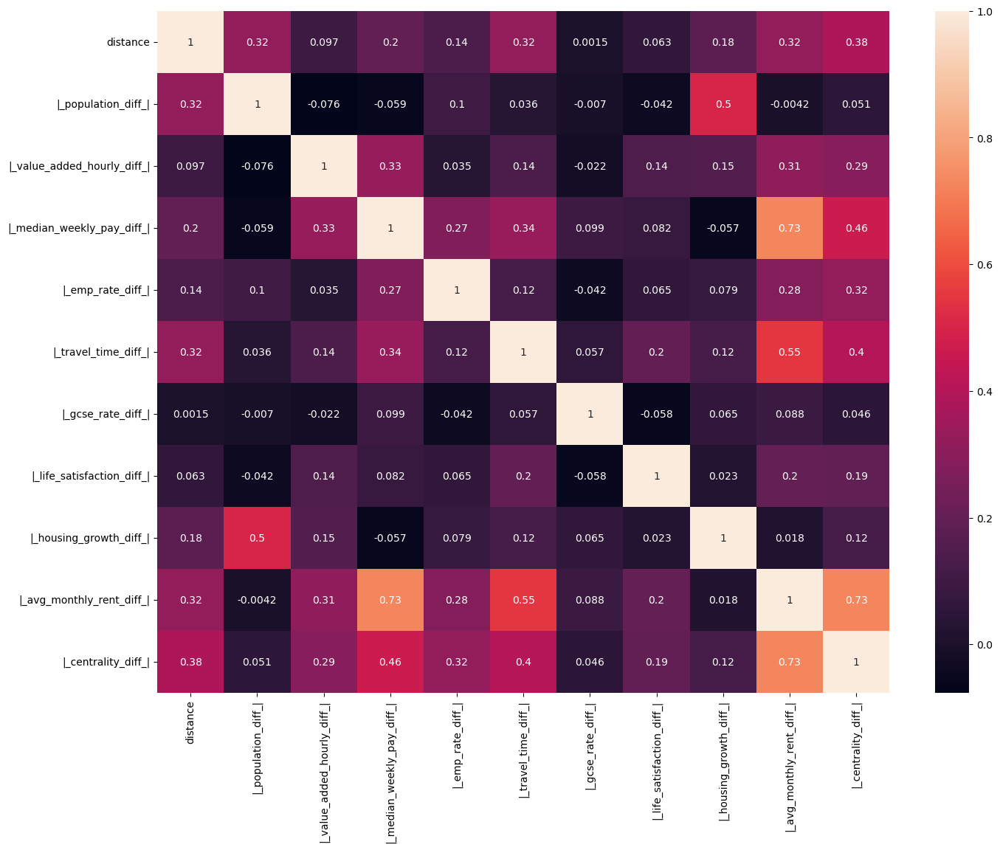

``` python
vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|     | Variable                        | VIF      |
|-----|---------------------------------|----------|
| 0   | const                           | 1.000000 |
| 1   | distance                        | 1.369576 |
| 2   | \|\_population_diff\_\|         | 1.534792 |
| 3   | \|\_value_added_hourly_diff\_\| | 1.261580 |
| 4   | \|\_median_weekly_pay_diff\_\|  | 2.389630 |
| 5   | \|\_emp_rate_diff\_\|           | 1.178689 |
| 6   | \|\_travel_time_diff\_\|        | 1.546928 |
| 7   | \|\_gcse_rate_diff\_\|          | 1.037265 |
| 8   | \|\_life_satisfaction_diff\_\|  | 1.085963 |
| 9   | \|\_housing_growth_diff\_\|     | 1.481976 |
| 10  | \|\_avg_monthly_rent_diff\_\|   | 4.340401 |
| 11  | \|\_centrality_diff\_\|         | 2.460915 |

</div>

The correlation matrix shows limited collinearity between the variables, with the greatest correlation between `'avg_monthly_rent_diff'` and `'median_weekly_pay_diff'` (0.73). This is not unexpected, as areas with higher rents will generally require a higher wage rate to afford the rent.

The VIF analysis corroborates this limited collinearity, as all values are below 10, a common concern threshold. All values are above 1, which indicates some level of collinearity present, again with the greatest values being `'avg_monthly_rent_diff'` (4.3) and `'median_weekly_pay_diff'` (2.4).

Multicollinearity violates the OLS assumptions and can lead to biased coefficient estimates, so it is important to accommodate for this. The OLS results show that `'avg_monthly_rent_diff'` is more significant than `'median_weekly_pay_diff'`, has a larger coefficient, and is more precise, however, the VIF results show it also has greater collinearity with other variables. To optimise for the OLS assumptions, and to avoid the `'avg_monthly_rent_diff'` soaking up explanatory power from correlated variables, I will drop it from the model in future iterations. This is, again, a researcher-driven, subjective decision.

## 3.2 Refined Linear Regression

Multiple paths can be taken to address the data’s skewness (shown in <a href="#fig-histogram" class="quarto-xref">Figure 6</a>). The most common is to use a log transformation. However, the absolute difference variables include zero values, which do not work with a log transformation. Therefore, a Yeo-Johnson transformation is used, a generalisation of the log transformation that can handle negative values (Yeo and Johnson, 2000).

``` python
commuteOLSr = commute.copy()
commuteOLSr = commuteOLSr.drop(columns=['journey_count_decile', '|_avg_monthly_rent_diff_|'])
commuteOLSr
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | pairs | journey_score | distance | \|\_population_diff\_\| | \|\_value_added_hourly_diff\_\| | \|\_median_weekly_pay_diff\_\| | \|\_emp_rate_diff\_\| | \|\_travel_time_diff\_\| | \|\_gcse_rate_diff\_\| | \|\_life_satisfaction_diff\_\| | \|\_housing_growth_diff\_\| | \|\_centrality_diff\_\| | route_midpoint\_(geo) |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | Barking and Dagenham - Barnet | -0.010609 | 25056.274464 | 171762 | 0.09 | 51.4 | 8.3 | 0.9 | 13.4 | 0.05 | 1202 | 0.017241 | POINT (-0.04437 51.57832) |
| 1 | Barking and Dagenham - Brent | -0.397323 | 27881.522854 | 128596 | 0.07 | 29.6 | 3.1 | 0.9 | 3.5 | 0.10 | 1356 | 0.068966 | POINT (-0.07310 51.55498) |
| 2 | Barking and Dagenham - Camden | 0.112844 | 20345.000863 | 1692 | 14.43 | 170.7 | 2.3 | 2.7 | 4.3 | 0.57 | 539 | 0.146552 | POINT (-0.01671 51.54431) |
| 3 | Barking and Dagenham - Enfield | -0.004368 | 19482.245346 | 116323 | 5.36 | 15.6 | 2.5 | 0.1 | 0.7 | 0.49 | 251 | 0.000000 | POINT (0.02400 51.59722) |
| 4 | Barking and Dagenham - Greenwich | 0.114385 | 9642.046411 | 69377 | 1.56 | 95.4 | 8.3 | 0.0 | 0.8 | 0.13 | 6 | 0.051724 | POINT (0.08979 51.50474) |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 672 | West Berkshire - Wokingham | 0.163863 | 29259.923429 | 10906 | 4.18 | 64.6 | 5.8 | 1.6 | 5.6 | 0.01 | 512 | 0.008621 | POINT (-1.08649 51.43427) |
| 673 | Westminster - Wiltshire | 0.075996 | 126401.984988 | 294570 | 21.88 | 290.4 | 10.8 | 9.5 | 4.9 | 0.29 | 2266 | 0.344828 | POINT (-1.03978 51.42052) |
| 674 | Westminster - Windsor and Maidenhead | 0.026557 | 37615.785116 | 54522 | 0.44 | 164.8 | 11.9 | 4.6 | 0.8 | 0.29 | 270 | 0.318966 | POINT (-0.41418 51.49627) |
| 675 | Westminster - Wokingham | -0.168467 | 51144.513300 | 36626 | 4.76 | 113.0 | 10.0 | 6.8 | 3.1 | 0.12 | 549 | 0.344828 | POINT (-0.52615 51.46758) |
| 676 | Windsor and Maidenhead - Wokingham | 0.161748 | 14209.316238 | 17896 | 5.20 | 51.8 | 1.9 | 2.2 | 2.3 | 0.17 | 819 | 0.025862 | POINT (-0.78738 51.45165) |

<p>677 rows × 13 columns</p>
</div>

``` python
columns_OLSr = [col for col in commuteOLSr.columns if col not in ['journey_score', 'pairs', 'route_midpoint_(geo)']]
transformer = PowerTransformer(method='yeo-johnson', standardize=True)
commuteOLSr[columns_OLSr] = transformer.fit_transform(commuteOLSr[columns_OLSr])
```

And running a new OLS regression with the transformed data (with dropped `'avg_monthly_rent_diff'`):

``` python
y = commuteOLSr['journey_score']
X = commuteOLSr[['distance', '|_population_diff_|', '|_value_added_hourly_diff_|',
                '|_median_weekly_pay_diff_|', '|_emp_rate_diff_|',
                 '|_travel_time_diff_|', '|_gcse_rate_diff_|',
                 '|_life_satisfaction_diff_|', '|_housing_growth_diff_|',
                 '|_centrality_diff_|']]
X = sm.add_constant(X)

rlr_model = sm.OLS(y, X).fit()

print(rlr_model.summary())
```

                                OLS Regression Results                            
    ==============================================================================
    Dep. Variable:          journey_score   R-squared:                       0.438
    Model:                            OLS   Adj. R-squared:                  0.430
    Method:                 Least Squares   F-statistic:                     51.99
    Date:                Mon, 05 May 2025   Prob (F-statistic):           7.24e-77
    Time:                        14:31:05   Log-Likelihood:                -164.77
    No. Observations:                 677   AIC:                             351.5
    Df Residuals:                     666   BIC:                             401.2
    Df Model:                          10                                         
    Covariance Type:            nonrobust                                         
    ===============================================================================================
                                      coef    std err          t      P>|t|      [0.025      0.975]
    -----------------------------------------------------------------------------------------------
    const                           0.3031      0.012     25.343      0.000       0.280       0.327
    distance                       -0.2759      0.013    -21.054      0.000      -0.302      -0.250
    |_population_diff_|             0.0593      0.013      4.449      0.000       0.033       0.086
    |_value_added_hourly_diff_|    -0.0050      0.013     -0.387      0.699      -0.031       0.021
    |_median_weekly_pay_diff_|     -0.0367      0.014     -2.649      0.008      -0.064      -0.009
    |_emp_rate_diff_|               0.0188      0.013      1.494      0.136      -0.006       0.044
    |_travel_time_diff_|            0.0180      0.014      1.294      0.196      -0.009       0.045
    |_gcse_rate_diff_|             -0.0139      0.012     -1.148      0.252      -0.038       0.010
    |_life_satisfaction_diff_|     -0.0079      0.012     -0.635      0.525      -0.032       0.016
    |_housing_growth_diff_|         0.0373      0.013      2.806      0.005       0.011       0.063
    |_centrality_diff_|            -0.0192      0.014     -1.390      0.165      -0.046       0.008
    ==============================================================================
    Omnibus:                       60.620   Durbin-Watson:                   1.604
    Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.204
    Skew:                           0.764   Prob(JB):                     4.67e-17
    Kurtosis:                       3.573   Cond. No.                         2.14
    ==============================================================================

    Notes:
    [1] Standard Errors assume that the covariance matrix of the errors is correctly specified.

### 3.2.1 Interpretation of the OLS results

General OLS considerations:

-   R-squared = 0.438, indicates that c.43.8% of the variation in `'journey_score'` is explained by the linear combination of predictors, an improvement from the previous model (c.20.1%)
    -   This is helpful for inference, as it suggests that the model is better at explaining the variation in the data, and therefore the coefficients are more reliable
-   F-statistic = 51.99 (p = c.0)
    -   Given the p-value is effectively zero, the model is again statistically significant for explaining some aspects of the variation

Key Variable:

-   `'distance'`, is the most influential with the largest coefficient (0.2759), an even larger effect than the previous model (+62.7%)
    -   As a result of the transformation, we can no longer make an inference on the marginal impact of a unit change without back-transforming, which is a trade-off
    -   It is statistically significant (p \< 0.001), and therefore, again we can be confident that this is a real effect
    -   The narrow confidence interval and large t-statistic implies a precisely estimated and statistically reliable effect

Other variables:

-   With the new specification, `'travel_time_diff'` is no longer significant at a 95% confidence level
-   From the OLS summary, the significant variables ranked (by absolute size of coefficient) are as follows:

| \# | Variable | Coefficient (β) | 95% CI | p-value | Relative to Simple OLS |
|---|-------------|--------|-----------|-----|----------------------------------|
| 1 | `distance` | -0.2728 | \[-0.302, -0.250\] | 0.000 | Stronger negative effect, still highly significant and precisely estimated |
| 2 | `population_diff` | +0.0593 | \[0.033, 0.086\] | 0.000 | Stronger positive effect, significant and generally precise |
| 3 | `housing_growth_diff` | +0.0373 | \[0.011, 0.063\] | 0.005 | Weaker positive effect, significant (but not at 0.1%) and generally precise |
| 4 | `median_weekly_pay_diff` | -0.0367 | \[-0.064, -0.009\] | 0.001 | Stronger negative effect, now significant |
| \- | All others | \- | CI include 0 | \>0.05 | No statistical significant 95% confidence |

The addition of `'median_weekly_pay_diff'` suggests that the correlation with `'avg_monthly_rent_diff'` may have impacted the inference of the previous model, whereas the exclusion of `'travel_time_diff'` may reflect the change in distribution following the transformation.

Following this, permutation importance:

``` python
y_pred = rlr_model.predict(X)
baseline_r2 = r2_score(y, y_pred)

feature_importances = {}

for col in X.columns[1:]:
    np.random.seed(0) # for reproducibility
    X_permuted = X.copy()
    X_permuted[col] = np.random.permutation(X_permuted[col])
    y_permuted_pred = rlr_model.predict(X_permuted)
    permuted_r2 = r2_score(y, y_permuted_pred)
    feature_importances[col] = baseline_r2 - permuted_r2

perm_importance = pd.DataFrame(list(feature_importances.items()), columns=[
                               'Variable', 'Permutation Importance'])
perm_importance = perm_importance.sort_values(
    by='Permutation Importance', ascending=False)

perm_importance.head(4) # only need to show top 4 to compare
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|     | Variable                       | Permutation Importance |
|-----|--------------------------------|------------------------|
| 0   | distance                       | 0.871311               |
| 1   | \|\_population_diff\_\|        | 0.038663               |
| 3   | \|\_median_weekly_pay_diff\_\| | 0.020285               |
| 8   | \|\_housing_growth_diff\_\|    | 0.017100               |

</div>

The results corroborate the Refined OLS with the four most influential variables and are again broadly consistent with the order.

Finally, with the dropped variable and transformed data, we can once again check for multicollinearity:

### 3.2.2 Multicollinearity

``` python
commuteOLSrcm = commuteOLSr.drop(columns=['pairs', 'journey_score', 'route_midpoint_(geo)'])

plt.figure(figsize=(16, 12)) 
sns.heatmap(commuteOLSrcm.corr(), annot=True)
```

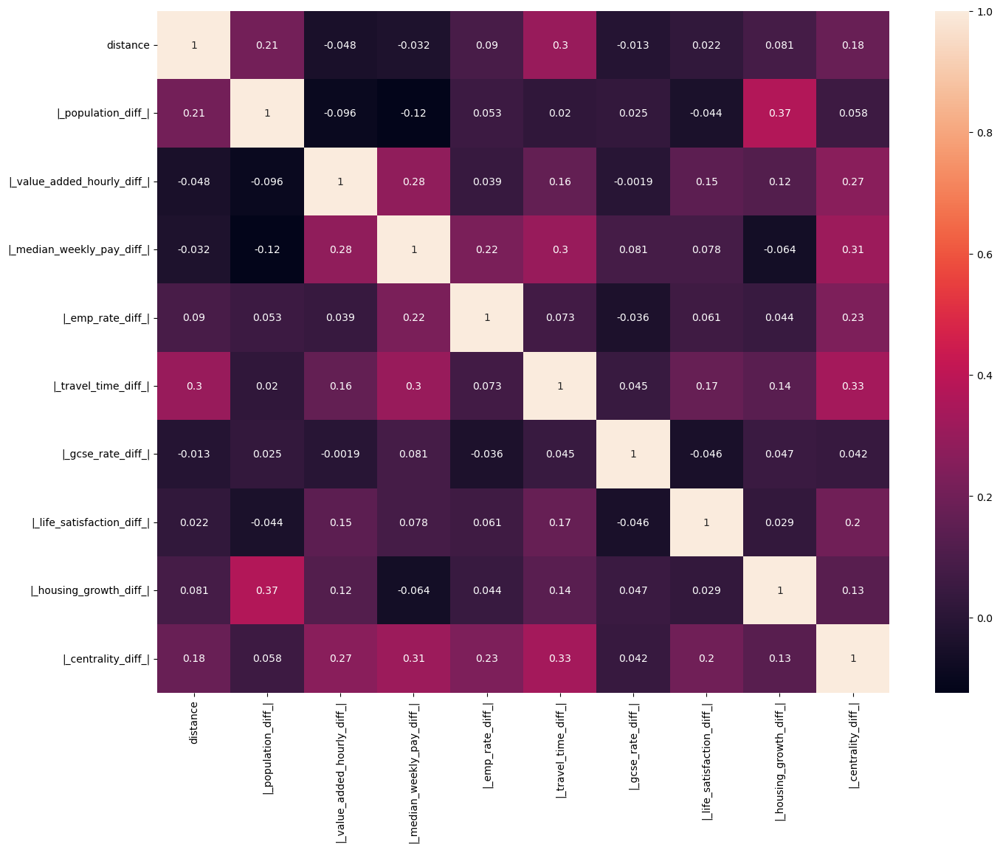

``` python
vif = pd.DataFrame()
vif['Variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|     | Variable                        | VIF      |
|-----|---------------------------------|----------|
| 0   | const                           | 1.000000 |
| 1   | distance                        | 1.200264 |
| 2   | \|\_population_diff\_\|         | 1.243007 |
| 3   | \|\_value_added_hourly_diff\_\| | 1.188374 |
| 4   | \|\_median_weekly_pay_diff\_\|  | 1.338856 |
| 5   | \|\_emp_rate_diff\_\|           | 1.108864 |
| 6   | \|\_travel_time_diff\_\|        | 1.348697 |
| 7   | \|\_gcse_rate_diff\_\|          | 1.018920 |
| 8   | \|\_life_satisfaction_diff\_\|  | 1.072590 |
| 9   | \|\_housing_growth_diff\_\|     | 1.233093 |
| 10  | \|\_centrality_diff\_\|         | 1.333514 |

</div>

Where the concerns around multicollinearity are reduced.

### 3.2.3 Discussion

Generally the results are similar to the previous OLS:

-   The top three variables in the new results are all within the top five of the previous OLS

    -   The addition of `'median_weekly_pay_diff'` is consistent with previous results due to its correlation with `'avg_monthly_rent_diff'` which was dropped

        -   Interetestingly the signs are different, suggesting as the differnce in median weekly pay increases, the `'journey_score'` decreases

-   The order of influence/importance is the same across both the Simple and Refined OLS for the shared variables

-   `'distance'` is materially ahead of the other variables for both, and is the only variable with a coefficient above 0.1 in either model

With the transformation, `'distance'` is an even more important predictor of `'journey_score'`, with a larger coefficient (0.2728, +62.7% relative to simple OLS) and a more precise estimate. As intuitive as this is, it still must be critically challenged. This had been partially addressed by using absolute differences in other variables so they are directionless too.

What remains unconsidered is the potential for spatial autocorrelation, which is a key concern in geospatial data. A disproportionate amount of data points near and within London is observed in the <a href="#fig-geo" class="quarto-xref">Figure 2</a> produced in <a href="#sec-eda" class="quarto-xref">Appendix B: Section 6.2</a>. Here, distances are shorter, and commuting flows more popular, which could inflate the role of `'distance'` while underestimating the influence of other socio-economic structure variables. In dense areas like London, shorter distances are still popular, however this may not be because they are short, but due to other factors, e.g. high job density. In addition, socio-economic factors are likely to be more similar nearby, therefore, OLS may not be able to separate the two, instead attributing the high flows to distance alone. Given the potential sampling bias with the overrepresentation of structurally similar regions located near each other, these issues may be magnified as those relationships, in turn, dominate the model. Therefore, addressing some elements of spatial autocorrelation may be necessary.

## 3.3 Spatial Error Model (SEM)

I use spatial models (e.g., Spatial Error or Lag Models) where residuals may be spatially autocorrelated, as otherwise, the OLS assumption of independence of errors is violated, and inference restricted. Spatial models can account for spatial structure within the residuals and, therefore, if autocorrelation is present, are more reliable than a standard OLS regression. Clustering in commuting flows relating to types of roles has been discussed in the literature (Hincks et al., 2018), and it is reasonable to assume that this may also be present in the data, impacting other variables. Therefore, this will give me more confidence in the inference I can draw to answer the research question.

> **Further Information on Spatial Error Models (SEM)**
>
> The form of the model is (Harris and Jarvis, 2011):
>
> $$
> y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \cdots + \lambda \mathbf{W} \xi + \varepsilon
> $$
>
> Where:
>
> -   $y$ is the dependent variable
>
> -   $x_1, x_2,...x_n$ are the independent variables
>
> -   $\beta_0$ is the intercept
>
> -   $\beta_1, \beta_2,...\beta_n$ are the coefficients
>
> -   $\lambda$ is the spatial autocorrelation coefficient
>
> -   $\mathbf{W}$ is the spatial weights matrix (i.e defines how observations are spatially connected)
>
> -   $\xi$ is the spatially correlated error term
>
> -   $\varepsilon$ is the error term for errors not spatially correlated
>
> Key Assumptions Specific to SEM:
>
> -   Spatial autocorrelation in residuals: The error term shows a spatial relationship, captured by $\lambda \mathbf{W} \xi$. This can be tested for using Moran’s I
>
> -   Correct specification of spatial weights: The matrix $\mathbf{W}$ must should accurately reflect the true spatial structure (e.g. distance-based vs kNN)
>
> -   No omitted spatial structure: All spatial dependence is captured within the relevant error term
>
> All other assumptions (e.g. linearity, no perfect multicollinearity, homoscedasticity) are the same as in an OLS regression

The SEM is a generalisation of the OLS model, and therefore, the same assumptions apply. The SEM also includes an additional assumption that the error term is spatially autocorrelated, which is the key difference between the two models.

``` python
commuteSEM = commuteOLSr.copy()
commuteSEM['residuals'] = rlr_model.resid
commuteSEM = gpd.GeoDataFrame(commuteSEM, geometry='route_midpoint_(geo)', crs='EPSG:4326')
commuteSEM = commuteSEM.to_crs(epsg=27700)
```

I ran two spatial weight specification types (distance-based and k-nearest neighbours (kNN)) at various thresholds to mimic sensitivity analysis.

Distance-based weights define neighbours by the physical distance for a given threshold, and kNN defines neighbours by the number of nearest neighbours:

``` python
commuteSEM['residuals'] = rlr_model.resid

d_thresholds = [10000, 20000, 50000, 100000, 200000]  # in m by default
k = [1, 2, 5, 10, 20]
results = {'Distance-based': [], 'kNN': []}

warnings.filterwarnings(
    'ignore', message="The weights matrix is not fully connected*") # get rid of error messags but can discuss

# distance-based 
for d in d_thresholds:
    w = DistanceBand.from_dataframe(
        commuteSEM, threshold=d, silence_warnings=True)
    w.transform = 'r'
    morani = Moran(commuteSEM['residuals'], w)
    results['Distance-based'].append((d / 1000, morani.I, morani.p_sim)) # switching to km

# kNN
for k in k:
    w = KNN.from_dataframe(commuteSEM, k=k)
    w.transform = 'r'
    morani = Moran(commuteSEM['residuals'], w)
    results['kNN'].append((k, morani.I, morani.p_sim))

distance = pd.DataFrame(results['Distance-based'],
                       columns=['Distance (km)', "Moran's I", 'p-value'])
knn = pd.DataFrame(results['kNN'], columns=['k', "Moran's I", 'p-value'])

print("Moran's I (distance-based):")
print(distance)
print("\nMoran's I (kNN):")
print(knn)
```

    Moran's I (distance-based):
       Distance (km)  Moran's I  p-value
    0           10.0   0.122814    0.001
    1           20.0   0.118623    0.001
    2           50.0   0.105237    0.001
    3          100.0   0.072716    0.001
    4          200.0   0.035270    0.001

    Moran's I (kNN):
        k  Moran's I  p-value
    0   1   0.065393    0.088
    1   2   0.118213    0.001
    2   5   0.135020    0.001
    3  10   0.156095    0.001
    4  20   0.143852    0.001

I selected the kNN specification with 10 neighbours. At 0.156, the Moran’s I value suggests signficant spatial autocorrelation, and is the highest value. The distance-based method adds neighbours in polynomial (or near polynomial) form, leading to greater sensitivity in Moran I’s values. In addition, at most thresholds, not all points are connected which would result in an exclusion of remote data points and therefore bias the results. The kNN method is less sensitive to this, as it will always include the same number of neighbours regardless of distance and generally the kNN method is more interpretable, as it is easier to understand the number of neighbours than the distance between them.

The selection between a Spatial Error Model (SEM) and e.g. a Spatial Lag Model (SLM) is based on the nature of the spatial autocorrelation i.e. SEM is when the spatial autocorrelation is in the residuals, and SLM when in the dependent variable. To test this I use two Lagrange Multiplier (LM) tests respectively:

``` python
w = KNN.from_dataframe(commuteSEM, k=10)
w.transform = 'r'
ols_model = OLS(y, X, w=w, name_y='journey_score', name_x=X.columns.tolist(), name_w='kNN10')
residuals = ols_model.u 

# LM Error
slm_res = lag_spatial(w, residuals)
n = len(y)
e = residuals
e_lag = slm_res
sse = np.sum(e**2)
sse_lag = np.sum(e * e_lag)
lm_error = (n * (sse_lag**2)) / (sse**2)
lm_error_p = 1 - stats.chi2.cdf(lm_error, df=1)

# LM lag
y_lag = lag_spatial(w, y)
lm_lag = (n * (np.sum(y_lag * e)**2)) / (sse * np.sum(y_lag**2))
lm_lag_p = 1 - stats.chi2.cdf(lm_lag, df=1)

print(f"LM Error test: {lm_error:.3f}, p-value: {lm_error_p:.3f}")
print(f"LM Lag test: {lm_lag:.3f}, p-value: {lm_lag_p:.3f}")
```

    LM Error test: 16.496, p-value: 0.000
    LM Lag test: 0.000, p-value: 1.000

The tests imply that spatial autocorrelation exists in the residuals but not dependent variables, therefore a SEM is appropriate:

``` python
sem_model = GM_Error_Het(y, X, w=w, name_ds='commuteOLS' , name_w="kNN, k=10", hard_bound=True) # SEM with heteroskedasticity

print(sem_model.summary)
```

    REGRESSION RESULTS
    ------------------

    SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES (HET)
    ------------------------------------------------------------
    Data set            :  commuteOLS
    Weights matrix      :   kNN, k=10
    Dependent Variable  :journey_score                Number of Observations:         677
    Mean dependent var  :      0.3031                Number of Variables   :          11
    S.D. dependent var  :      0.4122                Degrees of Freedom    :         666
    Pseudo R-squared    :      0.4137
    N. of iterations    :           1                Step1c computed       :          No

    ------------------------------------------------------------------------------------
                Variable     Coefficient       Std.Error     z-Statistic     Probability
    ------------------------------------------------------------------------------------
                CONSTANT         0.31282         0.03323         9.41436         0.00000
                distance        -0.34893         0.01441       -24.20732         0.00000
     |_population_diff_|         0.03319         0.01295         2.56337         0.01037
    |_value_added_hourly_diff_|        -0.00456         0.01158        -0.39342         0.69401
    |_median_weekly_pay_diff_|        -0.01664         0.01283        -1.29742         0.19449
       |_emp_rate_diff_|         0.01863         0.01113         1.67371         0.09419
    |_travel_time_diff_|         0.01954         0.01451         1.34692         0.17801
      |_gcse_rate_diff_|        -0.01647         0.01027        -1.60488         0.10852
    |_life_satisfaction_diff_|         0.00155         0.01157         0.13438         0.89310
    |_housing_growth_diff_|         0.03430         0.01250         2.74306         0.00609
     |_centrality_diff_|         0.02457         0.01331         1.84668         0.06479
                  lambda         0.68295         0.03580        19.07529         0.00000
    ------------------------------------------------------------------------------------
    Warning: Variable(s) ['const'] removed for being constant.
    ================================ END OF REPORT =====================================

### 3.3.1 Interpretation of the SEM results

General SEM considerations:

-   (Pseudo) R-squared = 0.4137
    -   This metric is not directly comparable to R-squared, but shows a goodness of fit relative to a model with no variables
    -   At 0.4137, this is a reasonable fit, explaining a fair amount of variation

Key Variable:

-   `'distance'`, is again the most influential with the largest coefficient (0.34893), continuing to dominate in terms of importance even after the consideration of spatial autcorrelation
    -   It is statistically significant still (p \< 0.001)

Other variables:

-   With the new model specification, `'median_weekly_pay_diff'` is no longer significant at any confidence level
-   From the OLS summary, the significant variables ranked (by absolute size of coefficient) are as follows:

| \# | Variable | Coefficient (β) | p-value | Interpretation vs Refined OLS |
|---|-------------|----------|------|-----------------------------------------|
| 1 | `distance` | -0.3489 | 0.000 | Stronger negative effect |
| 2 | `population_diff` | +0.0332 | 0.000 | Weaker positive effect |
| 3 | `housing_growth_diff` | +0.0343 | 0.006 | Weaker positive effect |
| \- | All others | \- | \>0.05 | Not statistically significant at 95% confidence level |

The hypothesis that spatial autocorrelation prevented the OLS from seperating the impact of each vraiable driving the relationship was correct. However the direction for `'distance'` was wrong, in actuality the other variables were soaking up the explanatory power of `'distance'`, instead of the other way around. Therefore, the SEM actually suggests that `'distance'` is even more important than the OLS.

The exclusion of `'median_weekly_pay_diff'` is interesting, as it was significant in the OLS, but with a counterintuitive negative relationship between difference and flow popularity. This may have been due to spatial autocorrelation, proving further evidence that the SEM adds insight to the inference task.

This is about as deep as I can go with linear regression, and even then, it is not clear whether the SEM/OLS are robust enough, in terms of satisfying key assumptions, to draw an inference with confidence.

This can be seen when assessing the residuals of the SEM:

``` python
sns.set_theme(style='darkgrid')
palette = ['#69b3a2']

plt.figure(figsize=(8, 6))
sns.scatterplot(x=sem_model.predy.flatten(),
                y=sem_model.u.flatten(), color=palette[0])
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted')
plt.tight_layout()
plt.show()
```

<figure id="fig-residuals">
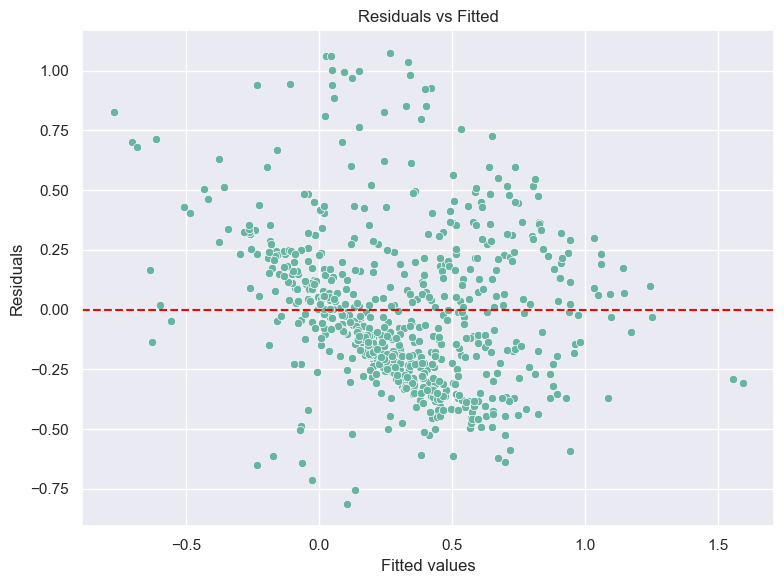
<figcaption>Figure 1: Scatterplot of residuals vs fitted values</figcaption>
</figure>

Here, we can see that despite best efforts, the variance of residuals changes with fitted values, i.e. heteroscedasticity persists.

# 4. Random Forest

Given that the assumptions of linear regression may not be fully satisfied in this context, I decide to use a Random Forest model which may be more appropriate.

Random Forests are more robust for inference as they do not rely on satisfying assumptions like linearity, homoscedasticity or independence of residuals. They handle outliers, multicollinearity, and non-linear relationships well, all of which may be relevant in this case.

The trade-off is that they do not provide effect sizes or directions when assessing feature importance directly, however in combination with the results of the regression models, they can provide a more complete picture of the relationships between variables.

This is shown below, using the original dataset (i.e. not standardised or transformed):

``` python
X.shape[1] # checking number of features
```

    11

``` python
y_rf = commute['journey_score']
X_rf = commute[['distance', '|_population_diff_|', '|_value_added_hourly_diff_|',
                '|_median_weekly_pay_diff_|', '|_emp_rate_diff_|',
                 '|_travel_time_diff_|', '|_gcse_rate_diff_|',
                 '|_life_satisfaction_diff_|', '|_housing_growth_diff_|',
                 '|_centrality_diff_|']]

(X_train,
 X_test,
 y_train,
 y_test) = skm.train_test_split(X_rf,
                                y_rf,
                                test_size=0.2,
                                random_state=0)

commuteRF = RF(max_features='sqrt',
               random_state=0).fit(X_train, y_train)
y_hat_RF = commuteRF.predict(X_test)
mse = np.mean((y_test - y_hat_RF)**2)
r2 = r2_score(y_test, y_hat_RF)

print(f"Mean Squared Error: {mse.round(3)}")
print(f"R-squared: {r2.round(3)}")
```

    Mean Squared Error: 0.084
    R-squared: 0.485

The R-squared of the Random Forest model is 0.485, which is a marginal improvement on the linear regression models, implying that the random forest is able to better capture the relationships between the variables

Rather than coefficients, the Random Forest model has a feature importance metric, which is a measure of how much each variable contributes to the model’s predictions:

``` python
rif_feature_importance = pd.Series(commuteRF.feature_importances_, index=X_train.columns).sort_values(ascending=False)
rif_feature_importance
```

    distance                       0.416896
    |_population_diff_|            0.088291
    |_housing_growth_diff_|        0.074278
    |_travel_time_diff_|           0.073151
    |_median_weekly_pay_diff_|     0.068869
    |_centrality_diff_|            0.065763
    |_value_added_hourly_diff_|    0.058756
    |_gcse_rate_diff_|             0.054705
    |_emp_rate_diff_|              0.051680
    |_life_satisfaction_diff_|     0.047610
    dtype: float64

Here, we can see that the most important variable is `'distance'` (0.4169), which is consistent with the OLS and SEM results. The other variables again include `'population_diff'` (0.0883) and `'housing_growth_diff'` (0.0743), consistent with the OLS and SEM results. However, `'travel_time_diff'` (0.0732) is now also included, and `'median_weekly_pay_diff'` (0.0689) is not materially more important than the added `'centrality'` variable (0.0658).

As discussed, Random Forest models are non-parametric, and hence, there is no additional information on concepts such as statistical significance, effect size, or direction of the relationship, in the scope of this method. Therefore, this is the extent of the inference.

And finally, permutation importance:

``` python
result = permutation_importance(commuteRF, X_test, y_test,
                                 n_repeats=5,
                                 random_state=0)

rif_perm_importance = pd.Series(result.importances_mean, index=X_test.columns).sort_values(ascending=False)
rif_perm_importance
```

    distance                       0.680163
    |_population_diff_|            0.156520
    |_centrality_diff_|            0.038961
    |_median_weekly_pay_diff_|     0.019008
    |_emp_rate_diff_|              0.015234
    |_travel_time_diff_|           0.012933
    |_housing_growth_diff_|        0.011483
    |_gcse_rate_diff_|             0.010611
    |_life_satisfaction_diff_|    -0.000230
    |_value_added_hourly_diff_|   -0.000486
    dtype: float64

The results are broadly consistent again, but `'centrality'` is more important than other metrics for the first time. Again, it is important to note that there is an element of randomness in the results, and therefore, they must be interpreted with caution.

# 5. Conclusion

My research question asked:

<h5 style="margin-top: 30px; margin-bottom: 30px; font-style: italic;">

“Which structural socioeconomic factors between regions most influence the relative popularity of commuting routes?”

</h5>

I employed three models to address this question: OLS, SEM, and Random Forest. I used linear regressions as my primary method of analysis as the models tend to have the most inferential power, providing insight into importance, direction and effect size. However, the assumptions of linear regression may not be fully satisfied in this context, and therefore, I also employed a Random Forest model, which is more robust to violations of the assumptions. Other models were not used, as generally there is a trade-off between complexity and interpretability.

They key metrics used for inference were the coefficients of the OLS and SEM models, and the feature importance of the Random Forest model. I also used permutation importance across all, as it is a consistent metric across models, however due to the random elements, the confidence in their reults is lower. Other potential metrics such as Shapley values, were briefly mentioned, but not employed for simplicity of the task.

Results were generally consistent across the models. With high confidence, I can say that `'distance'` is the most important structural variable that determines the relative popularity of commuting routes, and this is consistent with the literature on the subject (So et al., 2001). This was verified across all model types and specifications, and in each case, `'distance'` was materially more important than the next best variable. In all regression models, the coefficient of `'distance'` was negative, indicating that as distance increases, the popularity of the route decreases, and the results were statistically significant at all confidence levels. However, the literature (So et al., 2001) also focuses heavily on commuting time, which is not included in this analysis and is likely to be heavily correlated with distance. This is a key limitation of the analysis, as it is not possible to separate variables like `'distance'` from related factors, and therefore inference is limited abnd/or biased by researcher design.

`'population_diff'` was consistently the second most important variable across models (excluding the simple, pre-transformation OLS), and was statistically significant in all OLS and SEM models. These models showed that the larger the difference in the population, the higher the commuting flow’s relative popularity. This may reflect that larger populations by definiton have more people who can commute, leading to a higher commuting flow. It also may act as a proxy for other factors such as urban/rural splits, job density and many other socioeconomic factors.

Other consistently important variables included `'housing_growth_diff'` and `'median_weekly_pay_diff'`, where again, the greater the difference, the higher the relative popularity of the commuting flow. Importance rankings and significance varied across models, adding uncertainty to their interpretation. The former could be a lagging indicator of demand and, therefore, may be a proxy for other factors. The latter may reflect the economic trade-off associated with commuting.

Other variables did not consistently provide explanatory power for the relationship with commuting popularity, so I cannot draw any conclusions about their importance.

``` python
raise Exception("End of code") 
```

<pre><span class="ansi-red-fg ansi-bold">---------------------------------------------------------------------------</span>
<span class="ansi-red-fg ansi-bold">Exception</span>                                 Traceback (most recent call last)
Cell <span class="ansi-green-fg ansi-bold">In[84], line 3</span>
<span class="ansi-green-fg">      1</span> <span style="font-style:italic;color:rgb(95,135,135)"># | echo: false</span>
<span class="ansi-green-fg">      2</span> <span style="font-style:italic;color:rgb(95,135,135)"># | include: false</span>
<span class="ansi-green-fg ansi-bold">----&gt; 3</span> <span style="font-weight:bold;color:rgb(0,135,0)">raise</span> <span style="font-weight:bold;color:rgb(215,95,95)">Exception</span>(<span style="color:rgb(175,0,0)">"</span><span style="color:rgb(175,0,0)">End of code</span><span style="color:rgb(175,0,0)">"</span>) 

<span class="ansi-red-fg ansi-bold">Exception</span>: End of code</pre>

## References

Ahrens, A., & Lyons, S. (2021). Do rising rents lead to longer commutes? A gravity model of commuting flows in Ireland. Urban Studies, 58(2), 264–279. <https://doi.org/10.1177/0042098020910698>

Buckmann, M., & Joseph, A. (2022). An Interpretable Machine Learning Workflow with An Application to Economic Forecasting. SSRN Electronic Journal. <https://doi.org/10.2139/ssrn.4130517>

Harris, R., Jarvis, C. (2011). Statistics for Geography and Environmental Science (First Edition). Prentice Hall.

Hincks, S., Kingston, R., Webb, B., & Wong, C. (2018). A new geodemographic classification of commuting flows for England and Wales. International Journal of Geographical Information Science, 32(4), 663–684. <https://doi.org/10.1080/13658816.2017.1407416>

So, K. S., Orazem, P. F., & Otto, D. M. (2001). The Effects of Housing Prices, Wages, and Commuting Time on Joint Residential and Job Location Choices. American Journal of Agricultural Economics, 83(4), 1036–1048. <https://doi.org/10.1111/0002-9092.00228>

Tranos, E., Gheasi, M., & Nijkamp, P. (2015). International Migration: A Global Complex Network. Environment and Planning B: Planning and Design, 42(1), 4–22. <https://doi.org/10.1068/b39042>

Wander, M., & Blumenberg, E. (2024). Is housing affordability associated with shorter commutes for low-income workers? <https://doi.org/10.17610/T6Z32J>

Yeo, I.-K., & Johnson, R. (2000). A new family of power transformations to improve normality or symmetry. Biometrika, 87(4), 954–959. <https://doi.org/10.1093/biomet/87.4.954>

------------------------------------------------------------------------

# 6. Appendices

## 6.1 Appendix A: Setup

### 6.1.1 Environment

This notebook was written in Python 3.9.18. The environment can be retrieved from the [Github project repo](https://github.com/2601547/commute).

### 6.1.2 Packages

``` python
import os
import random
import warnings

import contextily as ctx
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import requests
import seaborn as sns
import sklearn.model_selection as skm
import statsmodels.api as sm

from esda.moran import Moran
from libpysal.weights import DistanceBand, KNN, lag_spatial
from scipy import stats
from scipy.stats import skew
from sklearn.ensemble import RandomForestRegressor as RF
from sklearn.inspection import permutation_importance
from sklearn.metrics import r2_score
from sklearn.preprocessing import PowerTransformer, StandardScaler
from spreg import GM_Error_Het, OLS
from statsmodels.stats.outliers_influence import variance_inflation_factor
```

## 6.2 Appendix B: Exploratory Data Analysis

> **Section Summary**
>
> -   Cleaned the dataset by:
>
>     -   Dropping routes missing values (“City of London” and “Isles of Scilly”)
>
> -   Add geographic information, including coordinates, using `geopandas`
>
>     -   Identified potential spatial autocorrelation
>
> -   Identified daily variation in `'journey_score'` for the same routes over time

The following section addresses exploration of the provided dataset, focusing on:

-   Understanding the data
-   Ensuring the data is clean and usable
-   Visualising the data to understand the context and distribution

The LAcommute.csv file is loaded into a pandas dataframe and displayed:

``` python
# relative file paths are used here as to not leak my name, although absolute paths may be better for reproducibility
base_data_dir = os.path.abspath('../../1. Data/LAcommute')
LAcommute = pd.read_csv(
    os.path.join(base_data_dir, "LAcommute.csv"), index_col=0)
LAcommute
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | gcse_rate_origin | life_satisfaction_origin | housing_growth_origin | value_added_hourly_dest | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-01 | Hartlepool | E06000001 | Hartlepool | E06000001 | 1.4414 | 9 | 0.000000 | 92401 | 92401 | ... | 67.6 | 7.33 | 161 | 28.31 | 487.40 | 67.1 | 12.9 | 67.6 | 7.33 | 161 |
| 1 | 2019-01-01 | Hartlepool | E06000001 | County Durham | E06000047 | -0.3129 | 3 | 37592.170378 | 92401 | 518562 | ... | 67.6 | 7.33 | 161 | 28.96 | 469.40 | 71.4 | 14.1 | 67.6 | 7.43 | 1343 |
| 2 | 2019-01-01 | Middlesbrough | E06000002 | Middlesbrough | E06000002 | 1.0253 | 10 | 0.000000 | 142134 | 142134 | ... | 63.2 | 7.21 | 456 | 29.30 | 420.80 | 65.6 | 15.4 | 63.2 | 7.21 | 456 |
| 3 | 2019-01-01 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.3086 | 7 | 13069.176565 | 142134 | 136699 | ... | 63.2 | 7.21 | 456 | 26.54 | 439.20 | 68.4 | 13.3 | 69.6 | 7.44 | 365 |
| 4 | 2019-01-01 | Middlesbrough | E06000002 | Stockton-on-Tees | E06000004 | 0.3772 | 8 | 7379.212731 | 142134 | 196860 | ... | 63.2 | 7.21 | 456 | 34.37 | 469.40 | 74.8 | 13.2 | 69.5 | 7.40 | 616 |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 316514 | 2019-12-31 | Westminster | E09000033 | Sutton | E09000029 | -0.6732 | 4 | 16964.439602 | 208415 | 208516 | ... | 77.3 | 7.21 | 580 | 35.19 | 565.80 | 77.4 | 9.0 | 82.0 | 7.36 | 313 |
| 316515 | 2019-12-31 | Westminster | E09000033 | Tower Hamlets | E09000030 | 1.3720 | 10 | 8616.142460 | 208415 | 305066 | ... | 77.3 | 7.21 | 580 | 60.46 | 680.30 | 74.4 | 4.4 | 72.4 | 7.13 | 3248 |
| 316516 | 2019-12-31 | Westminster | E09000033 | Waltham Forest | E09000031 | -0.4483 | 6 | 13672.865893 | 208415 | 281015 | ... | 77.3 | 7.21 | 580 | 34.63 | 624.70 | 71.5 | 7.2 | 71.5 | 7.30 | 1263 |
| 316517 | 2019-12-31 | Westminster | E09000033 | Wandsworth | E09000032 | 0.1871 | 8 | 7117.584240 | 208415 | 334558 | ... | 77.3 | 7.21 | 580 | 35.15 | 746.70 | 84.9 | 6.2 | 74.2 | 7.34 | 1415 |
| 316518 | 2019-12-31 | Westminster | E09000033 | Westminster | E09000033 | 1.6534 | 10 | 0.000000 | 208415 | 208415 | ... | 77.3 | 7.21 | 580 | 52.46 | 771.60 | 67.2 | 5.1 | 77.3 | 7.21 | 580 |

<p>316519 rows × 24 columns</p>
</div>

The 316519 rows represent various commuting flow routes within and between different areas of the UK from 1 January 2019 to 31 December 2019. Routes are reported as pairs of areas, with the origin and destination columns indicating each route’s start and end points. Given the areas are reported as local authorities (LA), as per the area codes, and implied from the dataset title, this data is likely sourced from the Office for National Statistics (ONS).

The first row shows “Hartlepool” to “Hartlepool,” meaning there is both intra- and inter-LA commuting.

There are 24 columns, which are listed as:

``` python
LAcommute.columns
```

    Index(['date', 'area_name_origin', 'area_code_origin', 'area_name_dest',
           'area_code_dest', 'journey_score', 'journey_count_decile', 'distance',
           'population_origin', 'population_dest', 'value_added_hourly_origin',
           'median_weekly_pay_origin', 'emp_rate_origin', 'travel_time_origin',
           'gcse_rate_origin', 'life_satisfaction_origin', 'housing_growth_origin',
           'value_added_hourly_dest', 'median_weekly_pay_dest', 'emp_rate_dest',
           'travel_time_dest', 'gcse_rate_dest', 'life_satisfaction_dest',
           'housing_growth_dest'],
          dtype='object')

We can also see some additional information about the dataset using `describe()`

``` python
LAcommute.describe()
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | journey_score | journey_count_decile | distance | population_origin | population_dest | value_added_hourly_origin | travel_time_origin | housing_growth_origin | value_added_hourly_dest | travel_time_dest | housing_growth_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|
| count | 316519.000000 | 316519.000000 | 316519.000000 | 3.165190e+05 | 3.165190e+05 | 316519.000000 | 316519.000000 | 316519.000000 | 316519.000000 | 316519.000000 | 316519.000000 |
| mean | 0.519814 | 6.280928 | 13044.446197 | 2.840599e+05 | 2.878074e+05 | 39.152417 | 8.476279 | 1158.507954 | 38.540809 | 8.655166 | 1160.971885 |
| std | 0.996988 | 2.821859 | 10767.620494 | 1.393700e+05 | 1.347657e+05 | 9.230682 | 2.772127 | 870.434423 | 8.907160 | 2.693593 | 852.007444 |
| min | -2.168800 | 1.000000 | 0.000000 | 2.098000e+03 | 2.098000e+03 | 23.790000 | 3.200000 | 0.000000 | 23.790000 | 3.200000 | 0.000000 |
| 25% | -0.230050 | 4.000000 | 6993.581679 | 2.084150e+05 | 2.122450e+05 | 31.820000 | 6.200000 | 547.000000 | 31.270000 | 7.000000 | 551.000000 |
| 50% | 0.464000 | 7.000000 | 11461.611507 | 2.789080e+05 | 2.810150e+05 | 36.820000 | 8.300000 | 969.000000 | 36.800000 | 8.400000 | 969.000000 |
| 75% | 1.172200 | 9.000000 | 17143.862769 | 3.311920e+05 | 3.345580e+05 | 46.140000 | 10.300000 | 1439.000000 | 45.240000 | 10.400000 | 1447.000000 |
| max | 8.677600 | 10.000000 | 269291.080357 | 1.150646e+06 | 1.150646e+06 | 60.810000 | 44.300000 | 4024.000000 | 60.810000 | 44.300000 | 4024.000000 |

</div>

We can see that `'journey_score,'` which will likely be the dependent variable, appears to have been standardised, i.e., a z-score is given for each pair. The mean is 0.5, close to the value of 0 you would expect, and the standard deviation is 1.0. The delta in the mean and 0 suggests that this may be a subset of a larger dataset that was standardised.

This also means that scores are relative, with scores of 0.5 and below reflecting a route that is less travelled than average and scores above 0.5 reflecting a more travelled route than average.

Further research identified that the original data source for this `'journey_score'` variable is from the [CDRC](https://data.cdrc.ac.uk/dataset/spectus-origin-destination-derived-mobility-data) based on mobile GPS data. The `'journey_score'` variable is confirmed as a z-score, standardised over 2019 to 2022. This presents a significant issue for interpretation as the interpretation becomes more akin to:

*“Holding other factors constant, a one-unit increase in the variable `'A'` is associated with a β change in the journey_score, measured in standard deviations relative to the 2019–2022 distribution”*

Which may not be intuitive to interpret or meaningful in the context of the research question.

More information can be found `.info()`

``` python
LAcommute.info()
```

    <class 'pandas.core.frame.DataFrame'>
    Index: 316519 entries, 0 to 316518
    Data columns (total 24 columns):
     #   Column                     Non-Null Count   Dtype  
    ---  ------                     --------------   -----  
     0   date                       316519 non-null  object 
     1   area_name_origin           316519 non-null  object 
     2   area_code_origin           316519 non-null  object 
     3   area_name_dest             316519 non-null  object 
     4   area_code_dest             316519 non-null  object 
     5   journey_score              316519 non-null  float64
     6   journey_count_decile       316519 non-null  int64  
     7   distance                   316519 non-null  float64
     8   population_origin          316519 non-null  int64  
     9   population_dest            316519 non-null  int64  
     10  value_added_hourly_origin  316519 non-null  float64
     11  median_weekly_pay_origin   316519 non-null  object 
     12  emp_rate_origin            316519 non-null  object 
     13  travel_time_origin         316519 non-null  float64
     14  gcse_rate_origin           316519 non-null  object 
     15  life_satisfaction_origin   316519 non-null  object 
     16  housing_growth_origin      316519 non-null  int64  
     17  value_added_hourly_dest    316519 non-null  float64
     18  median_weekly_pay_dest     316519 non-null  object 
     19  emp_rate_dest              316519 non-null  object 
     20  travel_time_dest           316519 non-null  float64
     21  gcse_rate_dest             316519 non-null  object 
     22  life_satisfaction_dest     316519 non-null  object 
     23  housing_growth_dest        316519 non-null  int64  
    dtypes: float64(6), int64(5), object(13)
    memory usage: 60.4+ MB

We also see that the data is not completely usable as provided due to inconsistent data types. For example, the column `'median_weekly_pay_origin'` is an object type with the incorrect storage style. This can be amended:

``` python
LAcommute.dtypes
```

    date                          object
    area_name_origin              object
    area_code_origin              object
    area_name_dest                object
    area_code_dest                object
    journey_score                float64
    journey_count_decile           int64
    distance                     float64
    population_origin              int64
    population_dest                int64
    value_added_hourly_origin    float64
    median_weekly_pay_origin      object
    emp_rate_origin               object
    travel_time_origin           float64
    gcse_rate_origin              object
    life_satisfaction_origin      object
    housing_growth_origin          int64
    value_added_hourly_dest      float64
    median_weekly_pay_dest        object
    emp_rate_dest                 object
    travel_time_dest             float64
    gcse_rate_dest                object
    life_satisfaction_dest        object
    housing_growth_dest            int64
    dtype: object

``` python
LAcommute['date'] = LAcommute['date'].apply(
    pd.to_datetime, format='%Y-%m-%d', errors='coerce')
other_columns = ['emp_rate_origin', 'emp_rate_dest',
                      'median_weekly_pay_origin', 'median_weekly_pay_dest',
                      'gcse_rate_origin', 'gcse_rate_dest',
                      'life_satisfaction_origin', 'life_satisfaction_dest',]
LAcommute[other_columns] = LAcommute[other_columns].apply(
    pd.to_numeric, errors='coerce')

LAcommute.dtypes
```

    date                         datetime64[ns]
    area_name_origin                     object
    area_code_origin                     object
    area_name_dest                       object
    area_code_dest                       object
    journey_score                       float64
    journey_count_decile                  int64
    distance                            float64
    population_origin                     int64
    population_dest                       int64
    value_added_hourly_origin           float64
    median_weekly_pay_origin            float64
    emp_rate_origin                     float64
    travel_time_origin                  float64
    gcse_rate_origin                    float64
    life_satisfaction_origin            float64
    housing_growth_origin                 int64
    value_added_hourly_dest             float64
    median_weekly_pay_dest              float64
    emp_rate_dest                       float64
    travel_time_dest                    float64
    gcse_rate_dest                      float64
    life_satisfaction_dest              float64
    housing_growth_dest                   int64
    dtype: object

We can then check for missing values and or duplicates:

``` python
if LAcommute.isnull().values.any():
    print("Missing values found")
else:
    print("No missing values")

if LAcommute[LAcommute.duplicated()].empty:
    print("No duplicates")
else:
    print("Duplicates found")
```

    Missing values found
    No duplicates

Although there are no duplicates, we can see some missing values. We can see the number of missing values in each column using:

``` python
missing_values = LAcommute.isnull().sum()
missing_values
```

    date                            0
    area_name_origin                0
    area_code_origin                0
    area_name_dest                  0
    area_code_dest                  0
    journey_score                   0
    journey_count_decile            0
    distance                        0
    population_origin               0
    population_dest                 0
    value_added_hourly_origin       0
    median_weekly_pay_origin     9599
    emp_rate_origin              9599
    travel_time_origin              0
    gcse_rate_origin             9586
    life_satisfaction_origin     9599
    housing_growth_origin           0
    value_added_hourly_dest         0
    median_weekly_pay_dest       6271
    emp_rate_dest                6271
    travel_time_dest                0
    gcse_rate_dest               6258
    life_satisfaction_dest       6271
    housing_growth_dest             0
    dtype: int64

That is a significant amount of missing values, so it is important to determine what is going on and following that, how to deal with them. We can see that they are not random, they are only for `'median_weekly_pay'`, `'emp_rate'`, `'gcse_rate'` and `'life_satisfaction'`.

``` python
missing_values_rows = LAcommute[LAcommute.isnull().any(axis=1)]
missing_values_rows
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | gcse_rate_origin | life_satisfaction_origin | housing_growth_origin | value_added_hourly_dest | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 294 | 2019-01-01 | City of London | E09000001 | City of London | E09000001 | -0.3374 | 10 | 0.000000 | 8765 | 8765 | ... | NaN | NaN | 206 | 57.01 | NaN | NaN | 7.9 | NaN | NaN | 206 |
| 295 | 2019-01-01 | City of London | E09000001 | Barking and Dagenham | E09000002 | -1.3314 | 2 | 16110.974505 | 8765 | 218828 | ... | NaN | NaN | 206 | 36.89 | 523.5 | 67.3 | 8.4 | 68.0 | 7.35 | 1048 |
| 296 | 2019-01-01 | City of London | E09000001 | Brent | E09000005 | -1.1846 | 2 | 13051.679464 | 8765 | 347424 | ... | NaN | NaN | 206 | 36.82 | 553.1 | 70.4 | 7.5 | 71.5 | 7.25 | 2404 |
| 297 | 2019-01-01 | City of London | E09000001 | Camden | E09000007 | -0.7811 | 6 | 5850.378829 | 8765 | 217136 | ... | NaN | NaN | 206 | 51.32 | 694.2 | 69.6 | 5.7 | 72.3 | 6.78 | 509 |
| 298 | 2019-01-01 | City of London | E09000001 | Hackney | E09000012 | -0.8153 | 5 | 4665.516680 | 8765 | 265825 | ... | NaN | NaN | 206 | 36.06 | 575.1 | 72.5 | 4.8 | 72.0 | 6.94 | 969 |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 316393 | 2019-12-31 | Newham | E09000025 | City of London | E09000001 | 0.3497 | 6 | 9090.106893 | 349786 | 8765 | ... | 70.7 | 7.51 | 1813 | 57.01 | NaN | NaN | 7.9 | NaN | NaN | 206 |
| 316422 | 2019-12-31 | Southwark | E09000028 | City of London | E09000001 | 1.4381 | 9 | 4597.455204 | 312591 | 8765 | ... | 71.0 | 7.17 | 1096 | 57.01 | NaN | NaN | 7.9 | NaN | NaN | 206 |
| 316448 | 2019-12-31 | Tower Hamlets | E09000030 | City of London | E09000001 | 0.5614 | 9 | 3961.057843 | 305066 | 8765 | ... | 72.4 | 7.13 | 3248 | 57.01 | NaN | NaN | 7.9 | NaN | NaN | 206 |
| 316464 | 2019-12-31 | Waltham Forest | E09000031 | City of London | E09000001 | -1.0617 | 1 | 10581.867402 | 281015 | 8765 | ... | 71.5 | 7.30 | 1263 | 57.01 | NaN | NaN | 7.9 | NaN | NaN | 206 |
| 316489 | 2019-12-31 | Westminster | E09000033 | City of London | E09000001 | 2.0080 | 10 | 4660.462296 | 208415 | 8765 | ... | 77.3 | 7.21 | 580 | 57.01 | NaN | NaN | 7.9 | NaN | NaN | 206 |

<p>15492 rows × 24 columns</p>
</div>

Since all rows appear to have the commonality of “City of London”, we can assume this is the source of the missing value. This is consistent with the implication that this is ONS data, as the City of London tends to be excluded from datasets due to its unique nature and small population.

It is simple to remove these rows, as they are likely irrelevant to the analysis.

``` python
LAcommute = LAcommute[
    (LAcommute['area_name_origin'] != 'City of London') &
    (LAcommute['area_name_dest'] != 'City of London')
]
```

We can once again check for missing values…

``` python
missing_values = LAcommute.isnull().sum()
missing_values
```

    date                          0
    area_name_origin              0
    area_code_origin              0
    area_name_dest                0
    area_code_dest                0
    journey_score                 0
    journey_count_decile          0
    distance                      0
    population_origin             0
    population_dest               0
    value_added_hourly_origin     0
    median_weekly_pay_origin     13
    emp_rate_origin              13
    travel_time_origin            0
    gcse_rate_origin              0
    life_satisfaction_origin     13
    housing_growth_origin         0
    value_added_hourly_dest       0
    median_weekly_pay_dest       13
    emp_rate_dest                13
    travel_time_dest              0
    gcse_rate_dest                0
    life_satisfaction_dest       13
    housing_growth_dest           0
    dtype: int64

However it appears that there are still some missing values in the dataset.

``` python
missing_values_rows = LAcommute[LAcommute.isnull().any(axis=1)]
missing_values_rows
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | gcse_rate_origin | life_satisfaction_origin | housing_growth_origin | value_added_hourly_dest | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 123116 | 2019-05-04 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | 0.7176 | 2 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 124824 | 2019-05-06 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 200539 | 2019-08-07 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | 2.0631 | 2 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 201407 | 2019-08-08 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | 2.0631 | 2 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 202255 | 2019-08-09 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 208769 | 2019-08-17 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 211118 | 2019-08-20 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | 0.7176 | 2 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 216123 | 2019-08-26 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 216842 | 2019-08-27 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 221053 | 2019-09-01 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 224334 | 2019-09-05 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | 0.7176 | 2 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 226828 | 2019-09-08 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |
| 231037 | 2019-09-13 | Isles of Scilly | E06000053 | Isles of Scilly | E06000053 | -0.6279 | 1 | 0.0 | 2098 | 2098 | ... | 89.5 | NaN | 0 | 39.28 | NaN | NaN | 44.3 | 89.5 | NaN | 0 |

<p>13 rows × 24 columns</p>
</div>

…which this time appears to be “Isles of Scilly”. We remove these too, noting it looks like all “Isles of Scilly” routes are to the “Isles of Scilly”.

``` python
LAcommute = LAcommute[
    (LAcommute['area_name_origin'] != 'Isles of Scilly')
]
```

``` python
missing_values = LAcommute.isnull().sum()
missing_values
```

    date                         0
    area_name_origin             0
    area_code_origin             0
    area_name_dest               0
    area_code_dest               0
    journey_score                0
    journey_count_decile         0
    distance                     0
    population_origin            0
    population_dest              0
    value_added_hourly_origin    0
    median_weekly_pay_origin     0
    emp_rate_origin              0
    travel_time_origin           0
    gcse_rate_origin             0
    life_satisfaction_origin     0
    housing_growth_origin        0
    value_added_hourly_dest      0
    median_weekly_pay_dest       0
    emp_rate_dest                0
    travel_time_dest             0
    gcse_rate_dest               0
    life_satisfaction_dest       0
    housing_growth_dest          0
    dtype: int64

It may be helpful to get a sense of where the routes are, as this will determine the scope of the analysis. First, we can list the unique local authorities in the dataset:

``` python
LA_count = LAcommute['area_name_origin'].nunique()
LA_count
```

    119

There are 119 LAs in the dataset, following the removal of the City of London and Isles of Scilly. To contexutalise we this can be plotted on map.

The coordinates for the LA can be found in the [government depo](https://geoportal.statistics.gov.uk/datasets/9cb3c710143649499ff6acaca927d205_0/explore), and is downloaded as the file `"LAD_Dec_2019_Boundaries_UK_BFC_2022_-5126023737554987305.csv"`.

``` python
LA_coordinates = pd.read_csv(
    os.path.join(base_data_dir, "LAD_Dec_2019_Boundaries_UK_BFC_2022_-5126023737554987305.csv"), index_col=0)

LA_coordinates.head()
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | objectid | lad19cd | lad19nm | lad19nmw | bng_e | bng_n | long | lat | st_areasha | st_lengths | Shape\_\_Area | Shape\_\_Length | GlobalID |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| FID |  |  |  |  |  |  |  |  |  |  |  |  |  |
| 1 | 1 | E06000001 | Hartlepool |  | 447160 | 531474 | -1.27018 | 54.676140 | 9.371262e+07 | 71011.933949 | 2.797890e+08 | 122680.152623 | d3127426-63c8-4358-a554-b3fe4f0e537e |
| 2 | 2 | E06000002 | Middlesbrough |  | 451141 | 516887 | -1.21099 | 54.544670 | 5.388156e+07 | 44481.691242 | 1.598722e+08 | 76614.777246 | 7caac8a1-a10b-4878-a2ab-4fdb80e987a4 |
| 3 | 3 | E06000003 | Redcar and Cleveland |  | 464361 | 519597 | -1.00608 | 54.567520 | 2.450695e+08 | 96703.989701 | 7.274510e+08 | 166599.724875 | 96cc264b-6155-48cb-8fc0-7e41684d2682 |
| 4 | 4 | E06000004 | Stockton-on-Tees |  | 444940 | 518183 | -1.30664 | 54.556911 | 2.049330e+08 | 123408.985928 | 6.086362e+08 | 212698.045558 | 051ae100-c81d-4cc1-989b-b65e71a9b942 |
| 5 | 5 | E06000005 | Darlington |  | 428029 | 515648 | -1.56835 | 54.535339 | 1.974757e+08 | 107206.401677 | 5.861353e+08 | 184666.724022 | c22c366b-0133-4b9a-8376-013e0c43d6f2 |

</div>

The coordinates are then added to the dataframe…

``` python
def merge_coordinates(df, coordinates, merge_col, prefix):
    df = df.merge(
        coordinates[['lad19nm', 'lat', 'long']],
        how='left',
        left_on=merge_col,
        right_on='lad19nm'
    )
    df = df.rename(columns={
        'lat': f'lat_{prefix}',
        'long': f'long_{prefix}'
    })
    return df.drop(columns=['lad19nm'])
```

``` python
LAcommute = merge_coordinates(LAcommute, LA_coordinates, 'area_name_origin', 'origin')
LAcommute = merge_coordinates(LAcommute, LA_coordinates, 'area_name_dest', 'dest')

LAcommute
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest | lat_origin | long_origin | lat_dest | long_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-01 | Hartlepool | E06000001 | Hartlepool | E06000001 | 1.4414 | 9 | 0.000000 | 92401 | 92401 | ... | 487.4 | 67.1 | 12.9 | 67.6 | 7.33 | 161 | 54.676140 | -1.27018 | 54.676140 | -1.27018 |
| 1 | 2019-01-01 | Hartlepool | E06000001 | County Durham | E06000047 | -0.3129 | 3 | 37592.170378 | 92401 | 518562 | ... | 469.4 | 71.4 | 14.1 | 67.6 | 7.43 | 1343 | 54.676140 | -1.27018 | 54.685131 | -1.84050 |
| 2 | 2019-01-01 | Middlesbrough | E06000002 | Middlesbrough | E06000002 | 1.0253 | 10 | 0.000000 | 142134 | 142134 | ... | 420.8 | 65.6 | 15.4 | 63.2 | 7.21 | 456 | 54.544670 | -1.21099 | 54.544670 | -1.21099 |
| 3 | 2019-01-01 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.3086 | 7 | 13069.176565 | 142134 | 136699 | ... | 439.2 | 68.4 | 13.3 | 69.6 | 7.44 | 365 | 54.544670 | -1.21099 | 54.567520 | -1.00608 |
| 4 | 2019-01-01 | Middlesbrough | E06000002 | Stockton-on-Tees | E06000004 | 0.3772 | 8 | 7379.212731 | 142134 | 196860 | ... | 469.4 | 74.8 | 13.2 | 69.5 | 7.40 | 616 | 54.544670 | -1.21099 | 54.556911 | -1.30664 |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 301022 | 2019-12-31 | Westminster | E09000033 | Sutton | E09000029 | -0.6732 | 4 | 16964.439602 | 208415 | 208516 | ... | 565.8 | 77.4 | 9.0 | 82.0 | 7.36 | 313 | 51.512199 | -0.15295 | 51.357559 | -0.17227 |
| 301023 | 2019-12-31 | Westminster | E09000033 | Tower Hamlets | E09000030 | 1.3720 | 10 | 8616.142460 | 208415 | 305066 | ... | 680.3 | 74.4 | 4.4 | 72.4 | 7.13 | 3248 | 51.512199 | -0.15295 | 51.515541 | -0.03643 |
| 301024 | 2019-12-31 | Westminster | E09000033 | Waltham Forest | E09000031 | -0.4483 | 6 | 13672.865893 | 208415 | 281015 | ... | 624.7 | 71.5 | 7.2 | 71.5 | 7.30 | 1263 | 51.512199 | -0.15295 | 51.594608 | -0.01881 |
| 301025 | 2019-12-31 | Westminster | E09000033 | Wandsworth | E09000032 | 0.1871 | 8 | 7117.584240 | 208415 | 334558 | ... | 746.7 | 84.9 | 6.2 | 74.2 | 7.34 | 1415 | 51.512199 | -0.15295 | 51.452400 | -0.20023 |
| 301026 | 2019-12-31 | Westminster | E09000033 | Westminster | E09000033 | 1.6534 | 10 | 0.000000 | 208415 | 208415 | ... | 771.6 | 67.2 | 5.1 | 77.3 | 7.21 | 580 | 51.512199 | -0.15295 | 51.512199 | -0.15295 |

<p>301027 rows × 28 columns</p>
</div>

And then the dataframe is converted to a geodataframe:

``` python
LAcommute_geo = LAcommute # a gdf with two geometries is difficult to save, so for the appendices I will use this temporarily and in the main recreate a seperate LAcommuute gdf

LAcommute_geo['geometry_origin'] = gpd.points_from_xy(
    LAcommute_geo['long_origin'], LAcommute_geo['lat_origin']
)
LAcommute_geo['geometry_dest'] = gpd.points_from_xy(
    LAcommute_geo['long_dest'], LAcommute_geo['lat_dest']
)

LAcommute_geo = gpd.GeoDataFrame(
    LAcommute_geo,
    geometry='geometry_origin',  # although I have added both geometries, for simlplicity I will only use the origin geometry for now
    crs='EPSG:4326'
)

LAcommute_geo = LAcommute_geo.drop(columns=['lat_origin', 'long_origin', 'lat_dest', 'long_dest'])
LAcommute_geo.head()
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | housing_growth_origin | value_added_hourly_dest | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest | geometry_origin | geometry_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-01 | Hartlepool | E06000001 | Hartlepool | E06000001 | 1.4414 | 9 | 0.000000 | 92401 | 92401 | ... | 161 | 28.31 | 487.4 | 67.1 | 12.9 | 67.6 | 7.33 | 161 | POINT (-1.27018 54.67614) | POINT (-1.27018 54.67614) |
| 1 | 2019-01-01 | Hartlepool | E06000001 | County Durham | E06000047 | -0.3129 | 3 | 37592.170378 | 92401 | 518562 | ... | 161 | 28.96 | 469.4 | 71.4 | 14.1 | 67.6 | 7.43 | 1343 | POINT (-1.27018 54.67614) | POINT (-1.84050 54.68513) |
| 2 | 2019-01-01 | Middlesbrough | E06000002 | Middlesbrough | E06000002 | 1.0253 | 10 | 0.000000 | 142134 | 142134 | ... | 456 | 29.30 | 420.8 | 65.6 | 15.4 | 63.2 | 7.21 | 456 | POINT (-1.21099 54.54467) | POINT (-1.21099 54.54467) |
| 3 | 2019-01-01 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.3086 | 7 | 13069.176565 | 142134 | 136699 | ... | 456 | 26.54 | 439.2 | 68.4 | 13.3 | 69.6 | 7.44 | 365 | POINT (-1.21099 54.54467) | POINT (-1.00608 54.56752) |
| 4 | 2019-01-01 | Middlesbrough | E06000002 | Stockton-on-Tees | E06000004 | 0.3772 | 8 | 7379.212731 | 142134 | 196860 | ... | 456 | 34.37 | 469.4 | 74.8 | 13.2 | 69.5 | 7.40 | 616 | POINT (-1.21099 54.54467) | POINT (-1.30664 54.55691) |

<p>5 rows × 26 columns</p>
</div>

and now this can be plotted on a map:

``` python
# the is reprojected (from EPSG:4326) to EPSG:3857
LAcommute_geo = LAcommute_geo.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(14, 18))

LAcommute_geo.plot(ax=ax, alpha=0.5, color='red', markersize=25, edgecolor='k',
               label='Local Authority (LA)')

ax.axis('off')

# an OpenStreetView basemap is added using contextily
ctx.add_basemap(ax)

ax.legend(fontsize=12)

plt.show()
```

<figure id="fig-geo">
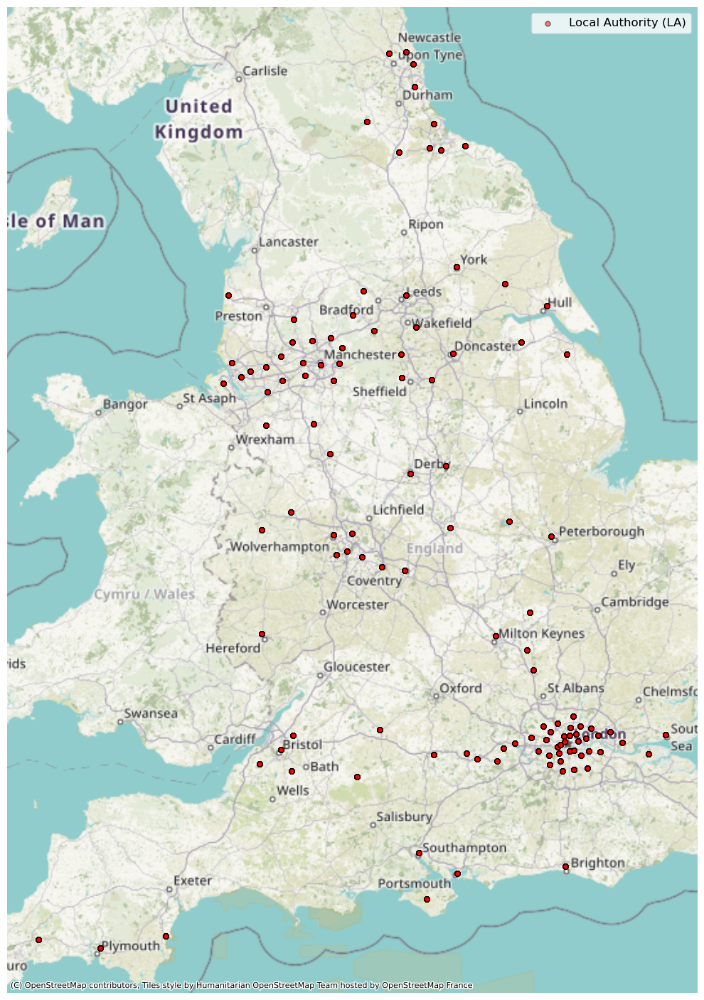
<figcaption>Figure 2: Geographic location of LAs on a map of the UK</figcaption>
</figure>

We can see a few things that need to be considered, as the dataset is:

-   Restricted to England LAs
-   Incomplete for England, excluding key areas such as Cheltenham, Exeter and Oxford. This could introduce sample selection bias
-   Heavily skewed towards the South East and London (although this may reflect real-world commuting patterns)

If we look take a look a random subsample of routes…

``` python
unique_routes = LAcommute[['area_name_origin',
                           'area_name_dest']].drop_duplicates()
random_routes = unique_routes.sample(n=3, random_state=0)

plotting_routes = LAcommute.merge(
    random_routes,
    on=['area_name_origin', 'area_name_dest']
)
plotting_routes['route'] = plotting_routes['area_name_origin'] + \
    ' to ' + plotting_routes['area_name_dest']

plt.figure(figsize=(12, 6))
sns.lineplot(data=plotting_routes, x='date', y='journey_score', hue='route')

plt.xlabel('Date')
plt.ylabel('Journey Score')
plt.title('Journey Score Over Time for Selected Routes')
plt.grid(True)
plt.legend(title='Route')
plt.show()
```

<figure id="fig-random_routes_score">
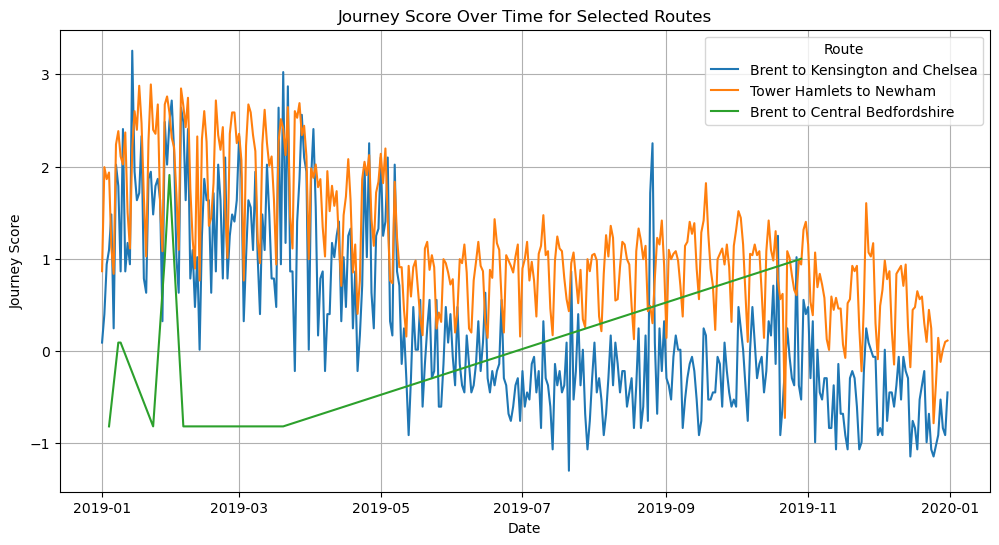
<figcaption>Figure 3: Line graph of journey scores for random routes</figcaption>
</figure>

And with `'journey_count_decile'`:

``` python
unique_routes = LAcommute[['area_name_origin',
                           'area_name_dest']].drop_duplicates()
random_routes = unique_routes.sample(n=3, random_state=0)

plotting_routes = LAcommute.merge(
    random_routes,
    on=['area_name_origin', 'area_name_dest']
)
plotting_routes['route'] = plotting_routes['area_name_origin'] + \
    ' to ' + plotting_routes['area_name_dest']

plt.figure(figsize=(12, 6))
sns.lineplot(data=plotting_routes, x='date', y='journey_count_decile', hue='route')

plt.xlabel('Date')
plt.ylabel('Journey Count Decile')
plt.title('Journey Count Decile Over Time for Selected Routes')
plt.grid(True)
plt.legend(title='Route', loc='upper right')
plt.show()
```

<figure id="fig-random_routes_deciles">
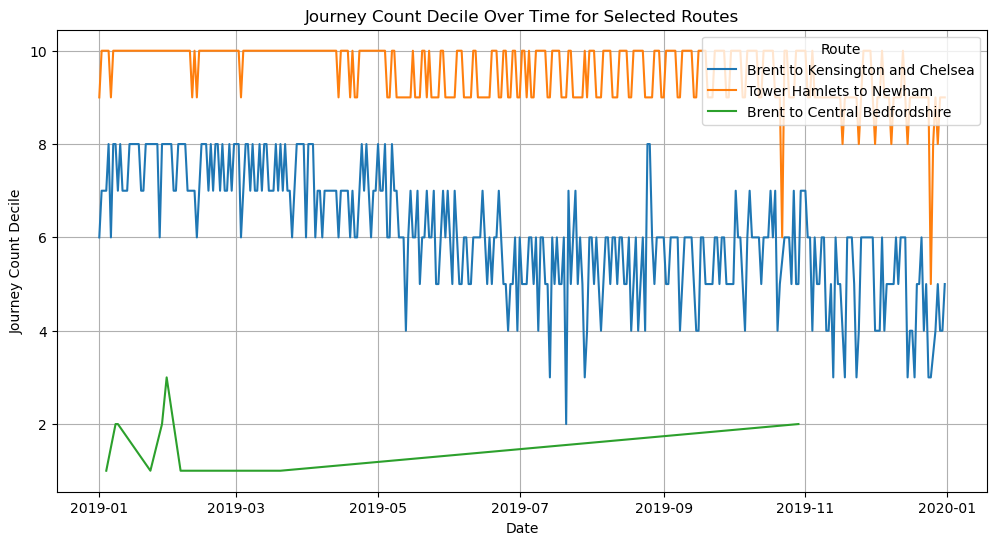
<figcaption>Figure 4: Line graph of journey count decile for random routes</figcaption>
</figure>

A few important things can be deduced about the wider dataset:

-   There is significant variation in the `'journey_score,'` i.e. som,e routes becoming both more and less popular over time   - There is less variation in the `'jouney_count_decile'` variable, which is likely a result of the aggregation process   - This will be critical for inferential design/feature selection, as the provided dataset suggested independent variables are all “point in time” rather than time series data
-   The routes are not constant over time, or there is data missing    - This is shown via “Brent” to “Central Bedfordshire”, which does not show any data in December 2019
-   There are some irregularities, such as the “Brent” route flatlining, which could be a result of data collection/input errors

To get a bit more insight, we can look at the means:

``` python
means = LAcommute.groupby(['area_name_origin', 'area_name_dest'])['journey_score'].mean()
route_means = round(means,3).reset_index()
route_means.columns = ['area_name_origin', 'area_name_dest', 'mean_journey_score']

route_means
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|      | area_name_origin     | area_name_dest           | mean_journey_score |
|------|----------------------|--------------------------|--------------------|
| 0    | Barking and Dagenham | Barking and Dagenham     | 1.155              |
| 1    | Barking and Dagenham | Brent                    | 0.000              |
| 2    | Barking and Dagenham | Camden                   | 0.010              |
| 3    | Barking and Dagenham | Enfield                  | 0.016              |
| 4    | Barking and Dagenham | Greenwich                | 0.030              |
| ...  | ...                  | ...                      | ...                |
| 1388 | Wolverhampton        | Wolverhampton            | 1.190              |
| 1389 | York                 | East Riding of Yorkshire | 0.148              |
| 1390 | York                 | Leeds                    | 0.161              |
| 1391 | York                 | Wakefield                | 0.000              |
| 1392 | York                 | York                     | 1.200              |

<p>1393 rows × 3 columns</p>
</div>

This shows the dataset is not standardised across routes, i.e. not reflecting relative popularity over time of the same route

From here on, information may be relevant to the analysis, so the file will be saved and renamed “LAcommute_clean.csv.”

Geographical data will be dropped as it will be added later, where relevant for feature additions rather than exploratory data analysis.

``` python
# echo: false
LAcommute
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest | lat_origin | long_origin | lat_dest | long_dest | geometry_origin | geometry_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-01 | Hartlepool | E06000001 | Hartlepool | E06000001 | 1.4414 | 9 | 0.000000 | 92401 | 92401 | ... | 12.9 | 67.6 | 7.33 | 161 | 54.676140 | -1.27018 | 54.676140 | -1.27018 | POINT (-1.27018 54.67614) | POINT (-1.27018 54.67614) |
| 1 | 2019-01-01 | Hartlepool | E06000001 | County Durham | E06000047 | -0.3129 | 3 | 37592.170378 | 92401 | 518562 | ... | 14.1 | 67.6 | 7.43 | 1343 | 54.676140 | -1.27018 | 54.685131 | -1.84050 | POINT (-1.27018 54.67614) | POINT (-1.84050 54.68513) |
| 2 | 2019-01-01 | Middlesbrough | E06000002 | Middlesbrough | E06000002 | 1.0253 | 10 | 0.000000 | 142134 | 142134 | ... | 15.4 | 63.2 | 7.21 | 456 | 54.544670 | -1.21099 | 54.544670 | -1.21099 | POINT (-1.21099 54.54467) | POINT (-1.21099 54.54467) |
| 3 | 2019-01-01 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.3086 | 7 | 13069.176565 | 142134 | 136699 | ... | 13.3 | 69.6 | 7.44 | 365 | 54.544670 | -1.21099 | 54.567520 | -1.00608 | POINT (-1.21099 54.54467) | POINT (-1.00608 54.56752) |
| 4 | 2019-01-01 | Middlesbrough | E06000002 | Stockton-on-Tees | E06000004 | 0.3772 | 8 | 7379.212731 | 142134 | 196860 | ... | 13.2 | 69.5 | 7.40 | 616 | 54.544670 | -1.21099 | 54.556911 | -1.30664 | POINT (-1.21099 54.54467) | POINT (-1.30664 54.55691) |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 301022 | 2019-12-31 | Westminster | E09000033 | Sutton | E09000029 | -0.6732 | 4 | 16964.439602 | 208415 | 208516 | ... | 9.0 | 82.0 | 7.36 | 313 | 51.512199 | -0.15295 | 51.357559 | -0.17227 | POINT (-0.15295 51.51220) | POINT (-0.17227 51.35756) |
| 301023 | 2019-12-31 | Westminster | E09000033 | Tower Hamlets | E09000030 | 1.3720 | 10 | 8616.142460 | 208415 | 305066 | ... | 4.4 | 72.4 | 7.13 | 3248 | 51.512199 | -0.15295 | 51.515541 | -0.03643 | POINT (-0.15295 51.51220) | POINT (-0.03643 51.51554) |
| 301024 | 2019-12-31 | Westminster | E09000033 | Waltham Forest | E09000031 | -0.4483 | 6 | 13672.865893 | 208415 | 281015 | ... | 7.2 | 71.5 | 7.30 | 1263 | 51.512199 | -0.15295 | 51.594608 | -0.01881 | POINT (-0.15295 51.51220) | POINT (-0.01881 51.59461) |
| 301025 | 2019-12-31 | Westminster | E09000033 | Wandsworth | E09000032 | 0.1871 | 8 | 7117.584240 | 208415 | 334558 | ... | 6.2 | 74.2 | 7.34 | 1415 | 51.512199 | -0.15295 | 51.452400 | -0.20023 | POINT (-0.15295 51.51220) | POINT (-0.20023 51.45240) |
| 301026 | 2019-12-31 | Westminster | E09000033 | Westminster | E09000033 | 1.6534 | 10 | 0.000000 | 208415 | 208415 | ... | 5.1 | 77.3 | 7.21 | 580 | 51.512199 | -0.15295 | 51.512199 | -0.15295 | POINT (-0.15295 51.51220) | POINT (-0.15295 51.51220) |

<p>301027 rows × 30 columns</p>
</div>

``` python
LAcommute = LAcommute.drop(columns=[
                           'lat_origin', 'long_origin', 'lat_dest', 'long_dest', 'geometry_origin', 'geometry_dest'])

LAcommute.to_csv(
    os.path.join(base_data_dir, "LAcommute_clean.csv"), index=True
)
```

``` python
# If running independently, please now follow the Research Design onwwards 
raise Exception("Stopping here as following Appendices does not directly follow")
```

<pre><span class="ansi-red-fg ansi-bold">---------------------------------------------------------------------------</span>
<span class="ansi-red-fg ansi-bold">Exception</span>                                 Traceback (most recent call last)
Cell <span class="ansi-green-fg ansi-bold">In[27], line 4</span>
<span class="ansi-green-fg">      1</span> <span style="font-style:italic;color:rgb(95,135,135)"># | echo: false</span>
<span class="ansi-green-fg">      2</span> <span style="font-style:italic;color:rgb(95,135,135)"># | include: false</span>
<span class="ansi-green-fg">      3</span> <span style="font-style:italic;color:rgb(95,135,135)"># If running independently, please now follow the Research Design onwwards </span>
<span class="ansi-green-fg ansi-bold">----&gt; 4</span> <span style="font-weight:bold;color:rgb(0,135,0)">raise</span> <span style="font-weight:bold;color:rgb(215,95,95)">Exception</span>(<span style="color:rgb(175,0,0)">"</span><span style="color:rgb(175,0,0)">Stopping here as following Appendices does not directly follow</span><span style="color:rgb(175,0,0)">"</span>)

<span class="ansi-red-fg ansi-bold">Exception</span>: Stopping here as following Appendices does not directly follow</pre>

## 6.3 Appendix C: Centrality

Exploring centrality using network graphs:

I will look at degree centrality for undirected networks, i.e. who has the most connections in terms of the number of links per node, although there are other measures of centrality.

``` python
commute_centr
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | date | area_name_origin | area_code_origin | area_name_dest | area_code_dest | journey_score | journey_count_decile | distance | population_origin | population_dest | ... | median_weekly_pay_dest | emp_rate_dest | travel_time_dest | gcse_rate_dest | life_satisfaction_dest | housing_growth_dest | lat_origin | long_origin | lat_dest | long_dest |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | 2019-01-02 | Hartlepool | E06000001 | Stockton-on-Tees | E06000004 | 1.5423 | 5 | 12951.008041 | 92401 | 196860 | ... | 469.4 | 74.8 | 13.2 | 69.5 | 7.40 | 616 | 54.676140 | -1.27018 | 54.556911 | -1.30664 |
| 1 | 2019-01-02 | Hartlepool | E06000001 | County Durham | E06000047 | 1.5683 | 5 | 37592.170378 | 92401 | 518562 | ... | 469.4 | 71.4 | 14.1 | 67.6 | 7.43 | 1343 | 54.676140 | -1.27018 | 54.685131 | -1.84050 |
| 2 | 2019-01-02 | Middlesbrough | E06000002 | Redcar and Cleveland | E06000003 | 0.9239 | 8 | 13069.176565 | 142134 | 136699 | ... | 439.2 | 68.4 | 13.3 | 69.6 | 7.44 | 365 | 54.544670 | -1.21099 | 54.567520 | -1.00608 |
| 3 | 2019-01-02 | Middlesbrough | E06000002 | Stockton-on-Tees | E06000004 | 1.8569 | 9 | 7379.212731 | 142134 | 196860 | ... | 469.4 | 74.8 | 13.2 | 69.5 | 7.40 | 616 | 54.544670 | -1.21099 | 54.556911 | -1.30664 |
| 4 | 2019-01-02 | Middlesbrough | E06000002 | County Durham | E06000047 | -1.0400 | 1 | 43441.543055 | 142134 | 518562 | ... | 469.4 | 71.4 | 14.1 | 67.6 | 7.43 | 1343 | 54.544670 | -1.21099 | 54.685131 | -1.84050 |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 188229 | 2019-12-31 | Westminster | E09000033 | Southwark | E09000028 | 1.0626 | 10 | 7319.207505 | 208415 | 312591 | ... | 631.9 | 79.4 | 6.1 | 71.0 | 7.17 | 1096 | 51.512199 | -0.15295 | 51.465919 | -0.07306 |
| 188230 | 2019-12-31 | Westminster | E09000033 | Sutton | E09000029 | -0.6732 | 4 | 16964.439602 | 208415 | 208516 | ... | 565.8 | 77.4 | 9.0 | 82.0 | 7.36 | 313 | 51.512199 | -0.15295 | 51.357559 | -0.17227 |
| 188231 | 2019-12-31 | Westminster | E09000033 | Tower Hamlets | E09000030 | 1.3720 | 10 | 8616.142460 | 208415 | 305066 | ... | 680.3 | 74.4 | 4.4 | 72.4 | 7.13 | 3248 | 51.512199 | -0.15295 | 51.515541 | -0.03643 |
| 188232 | 2019-12-31 | Westminster | E09000033 | Waltham Forest | E09000031 | -0.4483 | 6 | 13672.865893 | 208415 | 281015 | ... | 624.7 | 71.5 | 7.2 | 71.5 | 7.30 | 1263 | 51.512199 | -0.15295 | 51.594608 | -0.01881 |
| 188233 | 2019-12-31 | Westminster | E09000033 | Wandsworth | E09000032 | 0.1871 | 8 | 7117.584240 | 208415 | 334558 | ... | 746.7 | 84.9 | 6.2 | 74.2 | 7.34 | 1415 | 51.512199 | -0.15295 | 51.452400 | -0.20023 |

<p>188234 rows × 28 columns</p>
</div>

``` python
G = nx.Graph()
for _, row in commute_centr.iterrows():
    G.add_edge(row['area_name_origin'], row['area_name_dest'])
```

``` python
plt.figure(figsize=(24, 24))
pos = nx.circular_layout(G)
nx.draw(
    G, pos, with_labels=False,
    node_size=500, node_color='orange',
    edge_color='gray'
)
for node, (x, y) in pos.items():
    angle = np.arctan2(y, x)
    rotation = np.degrees(angle)
    if x < 0:
        rotation += 180
    plt.text(
        x, y, node,
        fontsize=13, color='black',
        ha='center', va='center',
        rotation=rotation, rotation_mode='anchor'
    )
plt.title('Network Graph of Commuting Routes', fontsize=28)
plt.show()
```

<figure id="fig-centr">
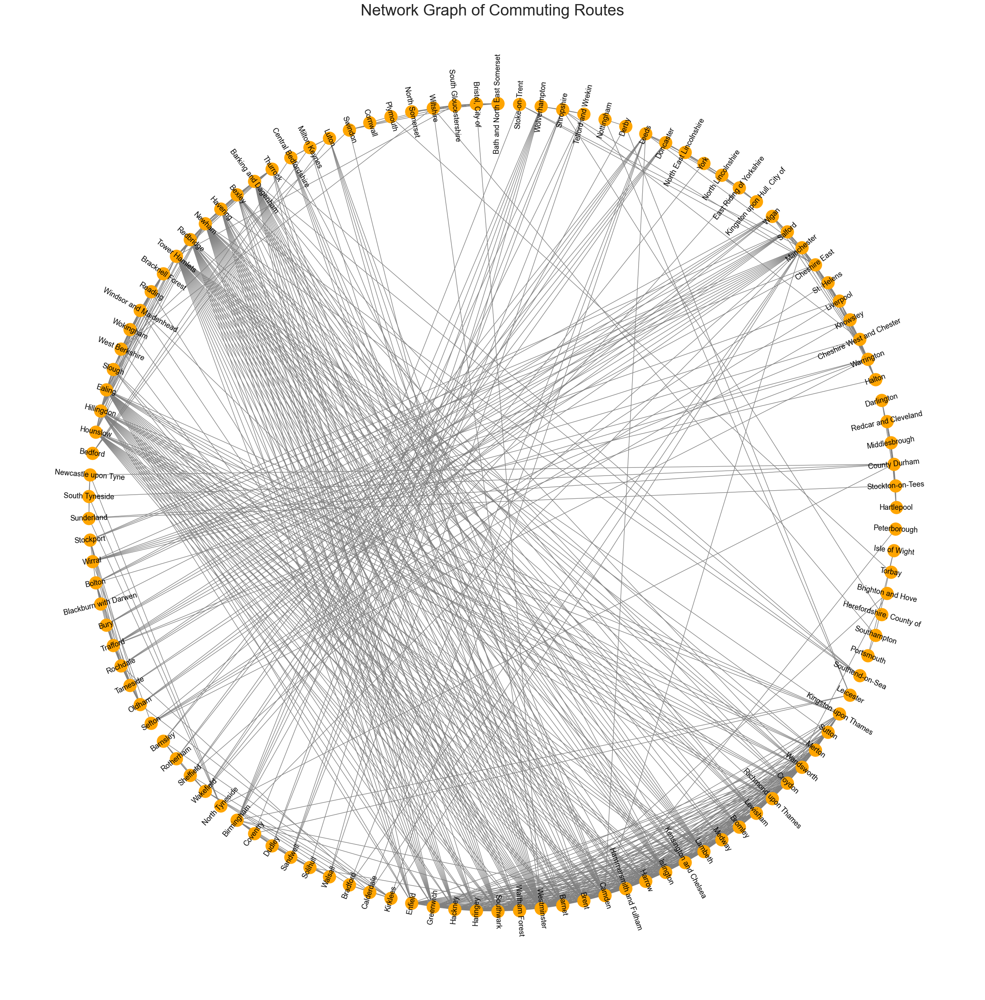
<figcaption>Figure 5: Network Graph of Commuting Routes</figcaption>
</figure>

``` python
raise Exception("Stopping here as following Appendices does not directly follow")
```

<pre><span class="ansi-red-fg ansi-bold">---------------------------------------------------------------------------</span>
<span class="ansi-red-fg ansi-bold">Exception</span>                                 Traceback (most recent call last)
Cell <span class="ansi-green-fg ansi-bold">In[88], line 3</span>
<span class="ansi-green-fg">      1</span> <span style="font-style:italic;color:rgb(95,135,135)"># | echo: false</span>
<span class="ansi-green-fg">      2</span> <span style="font-style:italic;color:rgb(95,135,135)"># | include: false</span>
<span class="ansi-green-fg ansi-bold">----&gt; 3</span> <span style="font-weight:bold;color:rgb(0,135,0)">raise</span> <span style="font-weight:bold;color:rgb(215,95,95)">Exception</span>(<span style="color:rgb(175,0,0)">"</span><span style="color:rgb(175,0,0)">Stopping here as following Appendices does not directly follow</span><span style="color:rgb(175,0,0)">"</span>)

<span class="ansi-red-fg ansi-bold">Exception</span>: Stopping here as following Appendices does not directly follow</pre>

## 6.4 Appendix D: Data Diagnostics

``` python
commute_trans
```

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>

|  | pairs | journey_score | journey_count_decile | distance | \|\_population_diff\_\| | \|\_value_added_hourly_diff\_\| | \|\_median_weekly_pay_diff\_\| | \|\_emp_rate_diff\_\| | \|\_travel_time_diff\_\| | \|\_gcse_rate_diff\_\| | \|\_life_satisfaction_diff\_\| | \|\_housing_growth_diff\_\| | \|\_avg_monthly_rent_diff\_\| | \|\_centrality_diff\_\| | route_midpoint\_(geo) |
|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|----|
| 0 | Barking and Dagenham - Barnet | -0.010609 | 1.363636 | 25056.274464 | 171762 | 0.09 | 51.4 | 8.3 | 0.9 | 13.4 | 0.05 | 1202 | 150.0 | 0.017241 | POINT (-0.04437 51.57832) |
| 1 | Barking and Dagenham - Brent | -0.397323 | 1.291667 | 27881.522854 | 128596 | 0.07 | 29.6 | 3.1 | 0.9 | 3.5 | 0.10 | 1356 | 252.0 | 0.068966 | POINT (-0.07310 51.55498) |
| 2 | Barking and Dagenham - Camden | 0.112844 | 2.959443 | 20345.000863 | 1692 | 14.43 | 170.7 | 2.3 | 2.7 | 4.3 | 0.57 | 539 | 858.0 | 0.146552 | POINT (-0.01671 51.54431) |
| 3 | Barking and Dagenham - Enfield | -0.004368 | 2.500977 | 19482.245346 | 116323 | 5.36 | 15.6 | 2.5 | 0.1 | 0.7 | 0.49 | 251 | 50.0 | 0.000000 | POINT (0.02400 51.59722) |
| 4 | Barking and Dagenham - Greenwich | 0.114385 | 2.973163 | 9642.046411 | 69377 | 1.56 | 95.4 | 8.3 | 0.0 | 0.8 | 0.13 | 6 | 150.0 | 0.051724 | POINT (0.08979 51.50474) |
| ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 672 | West Berkshire - Wokingham | 0.163863 | 2.844894 | 29259.923429 | 10906 | 4.18 | 64.6 | 5.8 | 1.6 | 5.6 | 0.01 | 512 | 175.0 | 0.008621 | POINT (-1.08649 51.43427) |
| 673 | Westminster - Wiltshire | 0.075996 | 1.931034 | 126401.984988 | 294570 | 21.88 | 290.4 | 10.8 | 9.5 | 4.9 | 0.29 | 2266 | 1633.0 | 0.344828 | POINT (-1.03978 51.42052) |
| 674 | Westminster - Windsor and Maidenhead | 0.026557 | 2.449654 | 37615.785116 | 54522 | 0.44 | 164.8 | 11.9 | 4.6 | 0.8 | 0.29 | 270 | 1183.0 | 0.318966 | POINT (-0.41418 51.49627) |
| 675 | Westminster - Wokingham | -0.168467 | 1.416667 | 51144.513300 | 36626 | 4.76 | 113.0 | 10.0 | 6.8 | 3.1 | 0.12 | 549 | 1283.0 | 0.344828 | POINT (-0.52615 51.46758) |
| 676 | Windsor and Maidenhead - Wokingham | 0.161748 | 2.881737 | 14209.316238 | 17896 | 5.20 | 51.8 | 1.9 | 2.2 | 2.3 | 0.17 | 819 | 100.0 | 0.025862 | POINT (-0.78738 51.45165) |

<p>677 rows × 15 columns</p>
</div>

To assess potential concerns in the data that might require transformations, we can use histogram visualisations, scatter plots and statistical tests:

``` python
commute_trans = commute_trans.drop(columns=[
    'journey_count_decile'])
```

``` python
numeric_cols = commute_trans.select_dtypes(
    include=['float64', 'int64']).columns
n_cols = 3
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()

palette = ['#69b3a2']
sns.set_theme(style='darkgrid')

for i, col in enumerate(numeric_cols):
    sns.histplot(commute_trans[col], kde=True,
                 color=palette[0], bins=30, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
```

<figure id="fig-histogram">
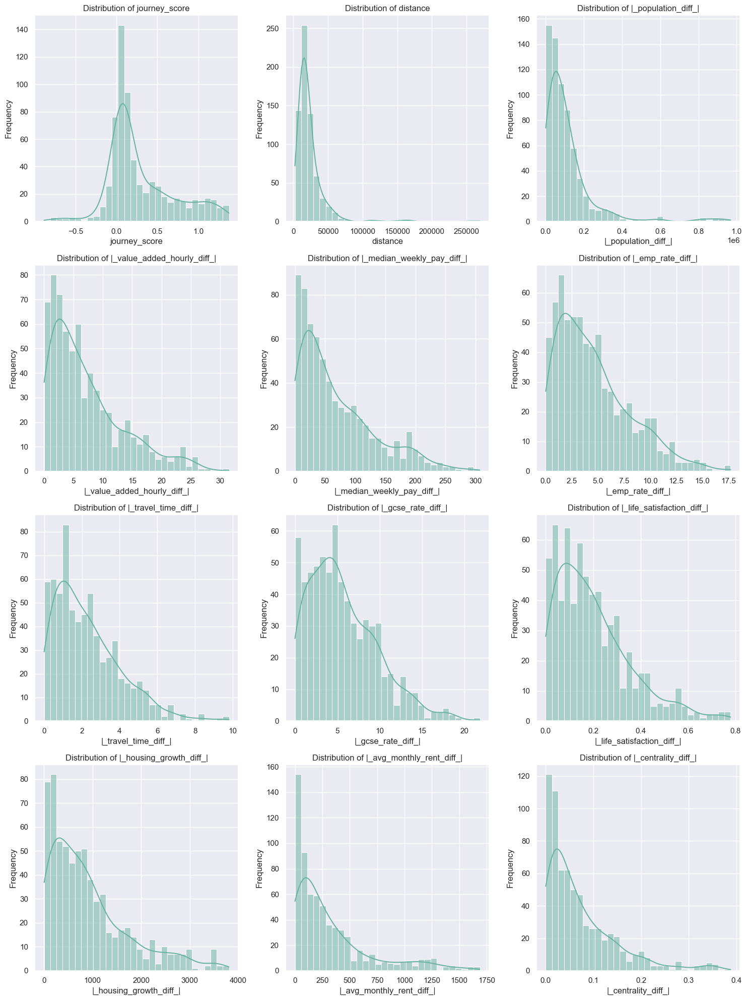
<figcaption>Figure 6: Histogram of distribution of commute data</figcaption>
</figure>

Almost all variables are rightly skewed which could be a concern for OLS, as it violates assumptions of normality.

``` python
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()

palette = ['#ffb347']
sns.set_theme(style='darkgrid')

for i, col in enumerate(numeric_cols):
    sns.boxplot(y=commute_trans[col], color=palette[0], ax=axes[i])
    axes[i].set_title(f'Box Plot of {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel(col)

for j in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
```

<figure id="fig-boxplot">
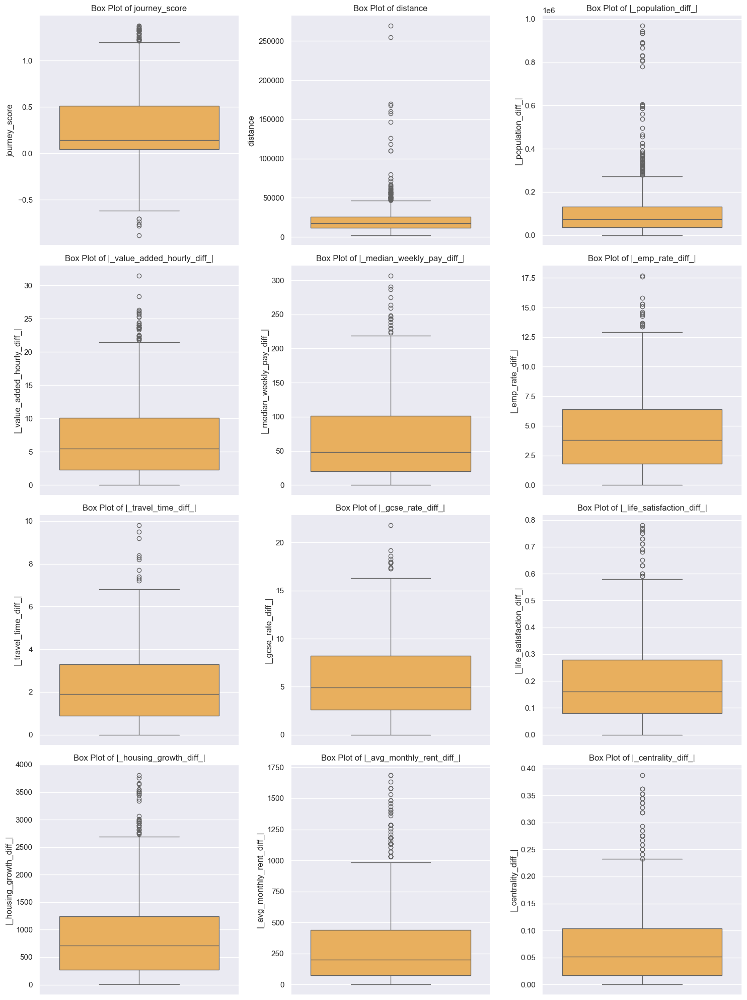
<figcaption>Figure 7: Box plot of distribution of commute data</figcaption>
</figure>

In addition we can look at the relationship between `'journey_score'` and the other variables to assess linearity. This is important for OLS, as it assumes a linear relationship between the dependent and independent variables:

``` python
y_sp = 'journey_score'
X_sp = [col for col in numeric_cols if col != y_sp]

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()

palette = ['#ff6961']
sns.set_theme(style='darkgrid')

for i, col in enumerate(X_sp):
    sns.scatterplot(
        x=commute_trans[col], y=commute_trans[y_sp], color=palette[0], ax=axes[i])
    axes[i].set_title(f'{col} vs {y_sp}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel(y_sp)

for j in range(len(X_sp), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
```

<figure id="fig-scatterplot">
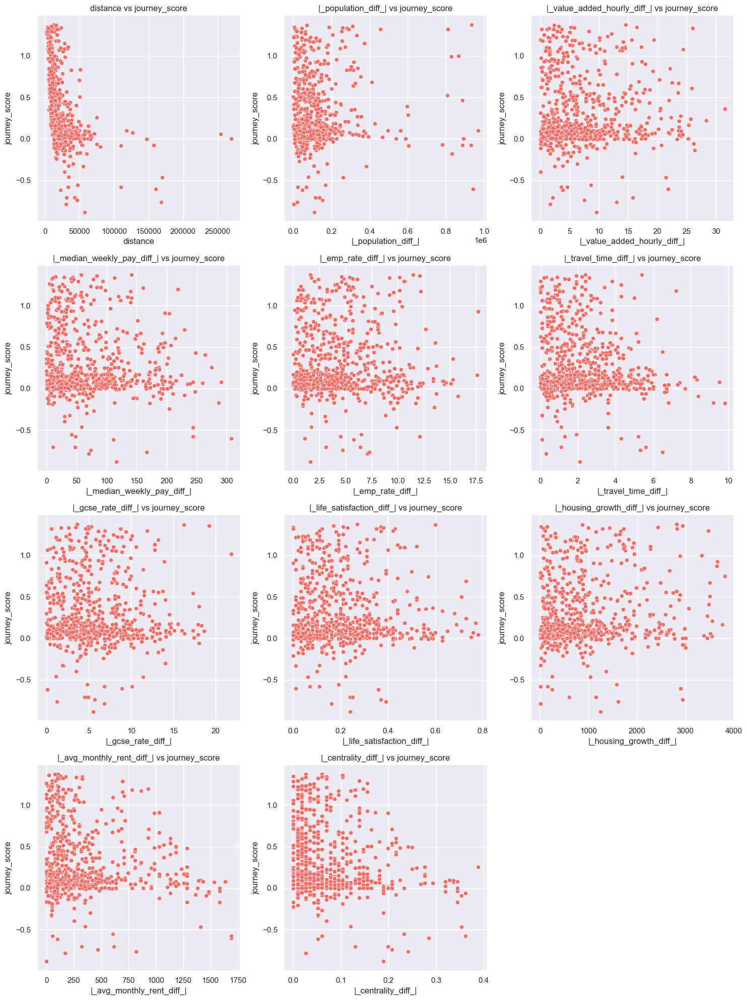
<figcaption>Figure 8: Scatterplot of distribution of commute data</figcaption>
</figure>

… the concerns around non-linearity are confirmed by the scatter plot all plots show show variance of `'journey_score'` increasing with X. This therefore violates a key OLS assumption.

``` python
raise Exception("Stopping here as following Appendices does not directly follow")
```

<pre><span class="ansi-red-fg ansi-bold">---------------------------------------------------------------------------</span>
<span class="ansi-red-fg ansi-bold">Exception</span>                                 Traceback (most recent call last)
Cell <span class="ansi-green-fg ansi-bold">In[94], line 3</span>
<span class="ansi-green-fg">      1</span> <span style="font-style:italic;color:rgb(95,135,135)"># | echo: false</span>
<span class="ansi-green-fg">      2</span> <span style="font-style:italic;color:rgb(95,135,135)"># | include: false</span>
<span class="ansi-green-fg ansi-bold">----&gt; 3</span> <span style="font-weight:bold;color:rgb(0,135,0)">raise</span> <span style="font-weight:bold;color:rgb(215,95,95)">Exception</span>(<span style="color:rgb(175,0,0)">"</span><span style="color:rgb(175,0,0)">Stopping here as following Appendices does not directly follow</span><span style="color:rgb(175,0,0)">"</span>)

<span class="ansi-red-fg ansi-bold">Exception</span>: Stopping here as following Appendices does not directly follow</pre>